In [105]:
import pandas as pd
import numpy as np
import re

Data Process for the housing price data.

In [106]:
df_train_price = pd.read_csv('/home/mw/input/hackathon255769/ruc_Class25Q2_train_price.csv')

/tmp/ipykernel_56/1231370925.py:1: DtypeWarning: Columns (3,32,34,43,46,49,51) have mixed types. Specify dtype option on import or set low_memory=False.
  df_train_price = pd.read_csv('/home/mw/input/hackathon255769/ruc_Class25Q2_train_price.csv')


In [107]:
#查看数据情况
df_train_price.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103871 entries, 0 to 103870
Data columns (total 55 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   城市         103871 non-null  int64  
 1   区域         103871 non-null  float64
 2   板块         103871 non-null  float64
 3   环线         40419 non-null   object 
 4   Price      103871 non-null  float64
 5   房屋户型       103291 non-null  object 
 6   所在楼层       103871 non-null  object 
 7   建筑面积       103871 non-null  object 
 8   套内面积       35984 non-null   object 
 9   房屋朝向       103870 non-null  object 
 10  建筑结构       103291 non-null  object 
 11  装修情况       103291 non-null  object 
 12  梯户比例       101252 non-null  object 
 13  配备电梯       91520 non-null   object 
 14  别墅类型       1443 non-null    object 
 15  交易时间       103871 non-null  object 
 16  交易权属       103871 non-null  object 
 17  上次交易       78422 non-null   object 
 18  房屋用途       103870 non-null  object 
 19  房屋年限       59361 non-nu

In [108]:
def fill_property_from_advantage(house_advantage, house_property):
    """
    从“房屋优势”列提取“满五年/满两年”，填补“房屋产权”的空缺
    :param house_advantage: 单条样本的“房屋优势”值（可能为NaN/字符串）
    :param house_property: 单条样本的“房屋产权”值（可能为NaN/字符串）
    :return: 处理后的“房屋产权”值
    """
    # 第一步：判断“房屋产权”是否为空（含NaN、空字符串、仅符号等无效值）
    # 清理“房屋产权”：去除前后空格和特殊符号（如“、”“，”）
    if pd.isna(house_property):
        clean_property = ""
    else:
        clean_property = str(house_property).strip().replace("、", "").replace(",", "")
    
    # 若“房屋产权”已有有效内容（非空），直接返回原值，不改动
    if clean_property != "":
        return house_property
    
    # 第二步：若“房屋产权”为空，从“房屋优势”中提取“满五年/满两年”
    # 先判断“房屋优势”是否为有效字符串
    if pd.isna(house_advantage):
        return house_property  # 优势为空，无法提取，保持产权空缺
    else:
        advantage_str = str(house_advantage)
    
    # 用正则精准匹配“满五年”或“满两年”（忽略前后无关字符，如“房本满五年”“、满两年”）
    match = re.search(r'满(五|两)年', advantage_str)
    if match:
        # 提取匹配结果（如“满五年”“满两年”）
        extracted_feature = match.group()
        return extracted_feature  # 用提取的特征填补产权
    else:
        return house_property  # 未匹配到，保持产权空缺

df_train_price["房屋年限"] = df_train_price.apply(
    lambda row: fill_property_from_advantage(row["房屋优势"], row["房屋年限"]),
    axis=1
)

In [109]:
#按列分块，提取series列
df_chengshi = df_train_price['城市']
df_quyu = df_train_price['区域']
df_bankuai = df_train_price['板块']
df_huanxian = df_train_price['环线']
df_Price = df_train_price['Price']
df_fangwuhuxing = df_train_price['房屋户型']
df_suozailouceng = df_train_price['所在楼层']
df_jianzhumianji = df_train_price['建筑面积']
df_taoneimianji = df_train_price['套内面积']
df_fangwuchaoxiang = df_train_price['房屋朝向']
df_jianzhujiegou = df_train_price['建筑结构']
df_zhuangxiuqingkuang = df_train_price['装修情况']
df_tihubili = df_train_price['梯户比例']
df_peibeidianti = df_train_price['配备电梯']
df_bieshuleixing = df_train_price['别墅类型']
df_jiaoyishijian = df_train_price['交易时间']
df_jiaoyiquanshu = df_train_price['交易权属']
df_shangcijiaoyi = df_train_price['上次交易']
df_fangwuyongtu = df_train_price['房屋用途']
df_fangwunianxian = df_train_price['房屋年限']
df_chanquansuoshu = df_train_price['产权所属']
df_diyaxinxi = df_train_price['抵押信息']
df_fangwuyoushi = df_train_price['房屋优势']
df_hexinmaidian = df_train_price['核心卖点']
df_huxingjieshao = df_train_price['户型介绍']
df_zhoubianpeitao = df_train_price['周边配套']
df_jiaotongchuxing = df_train_price['交通出行']
df_lon = df_train_price['lon']
df_lat = df_train_price['lat']
df_nianfen = df_train_price['年份']
df_quxian = df_train_price['区县']
df_bankuai_comm = df_train_price['板块_comm']
df_huanxianweizhi = df_train_price['环线位置']
df_wuyeleibie = df_train_price['物业类别']
df_jianzhuniandai = df_train_price['建筑年代']
df_kaifashang = df_train_price['开发商']
df_fangwuzongshu = df_train_price['房屋总数']
df_loudongzongshu = df_train_price['楼栋总数']
df_wuyegongsi = df_train_price['物业公司']
df_lvhualv = df_train_price['绿 化 率']
df_rongjilv = df_train_price['容 积 率']
df_wuyefei = df_train_price['物 业 费']
df_jianzhujiegou_comm = df_train_price['建筑结构_comm']
df_wuyebangongdianhua = df_train_price['物业办公电话']
df_chanquanmiaoshu = df_train_price['产权描述']
df_gongshui = df_train_price['供水']
df_gongnuan = df_train_price['供暖']
df_gongdian = df_train_price['供电']
df_ranqifei = df_train_price['燃气费']
df_gongrefei = df_train_price['供热费']
df_tingchewei = df_train_price['停车位']
df_tingchefeiyong = df_train_price['停车费用']
df_coord_x = df_train_price['coord_x']
df_coord_y = df_train_price['coord_y']
df_kehufankui = df_train_price['客户反馈']

In [110]:
#依次处理数据
huanxianweizhi_bank = []
for s in df_huanxian:
    if pd.isna(s):
        continue
    huanxianweizhi_bank.append(s)
    huanxianweizhi_bank = set(huanxianweizhi_bank)
    huanxianweizhi_bank = list(huanxianweizhi_bank)

ring_mapping = {
    "二环内": 0,
    "二至三环": 1,
    "三至四环": 2,
    "四至五环": 3,
    "五至六环": 4,
    "六环外": 5,
    
    "内环内": 6,
    "内环至中环": 7,
    "中环至外环": 8,
    "内环至外环": 9,
    "外环外": 10
}

df_huanxian = df_huanxian.map(ring_mapping)
df_huanxian = pd.DataFrame(df_huanxian)
df_huanxian

,环线
0,1.0
1,4.0
2,4.0
3,5.0
4,2.0
...,...
103866,NaN
103867,NaN
103868,NaN
103869,NaN


In [111]:
huxing_info = []
for s in df_fangwuhuxing:
    match_full = re.match(r"(\d+)室(\d+)厅(\d+)厨(\d+)卫", str(s))
    match_simple = re.match(r"(\d+)房间(\d+)卫", str(s))
    if match_full:
        shi = int(match_full.group(1))
        ting = int(match_full.group(2))
        chu = int(match_full.group(3))
        wei = int(match_full.group(4))
    elif match_simple:
        shi = int(match_simple.group(1))
        ting = 0
        chu = 0
        wei = int(match_simple.group(2))
    else:
        shi = np.nan
        ting = np.nan
        chu = np.nan
        wei = np.nan
    huxing_info.append([shi,ting,chu,wei])
df_fangwuhuxing = pd.DataFrame(huxing_info)
columns = ['室数','厅数','厨数','卫数']
df_fangwuhuxing.columns = columns
df_fangwuhuxing

,室数,厅数,厨数,卫数
0,2.0,1.0,1.0,1.0
1,3.0,1.0,1.0,1.0
2,3.0,2.0,1.0,2.0
3,6.0,3.0,1.0,3.0
4,1.0,0.0,0.0,1.0
...,...,...,...,...
103866,2.0,2.0,1.0,1.0
103867,3.0,1.0,1.0,1.0
103868,3.0,1.0,1.0,1.0
103869,3.0,1.0,1.0,1.0


In [112]:
df_suozailouceng
louceng_info = []
for s in df_suozailouceng:
    match_outside = re.match(r'^(.*?)\s*\(', s) # 识别括号前的文字
    match_inside = re.search(r'共(\d+)层', s)
    if match_outside:
        floor_position = match_outside.group(1).strip()
    else:
        floor_position = None
    
    if match_inside:
        total_floors = int(match_inside.group(1))
    else:
        total_floors = None
    louceng_info.append([floor_position,total_floors])
df_suozailouceng = pd.DataFrame(louceng_info)
columns = ['楼层位置','总层数']
df_suozailouceng.columns = columns
df_suozailouceng['楼层位置'] = df_suozailouceng['楼层位置'].replace({'地下室':0,"底层":1,"低楼层": 2,'中楼层':3,'高楼层':4,'顶层':5}) 
df_suozailouceng

,楼层位置,总层数
0,3,5
1,5,6
2,2,6
3,1,2
4,3,10
...,...,...
103866,3,6
103867,2,9
103868,3,6
103869,3,17


In [113]:
mianji = []
for s in df_jianzhumianji:
    match = re.search(r'(\d+\.?\d*)㎡', s)
    if match:
        area = float(match.group(1))
    else:
        area = None
    mianji.append([area])
df_jianzhumianji = pd.DataFrame(mianji)
columns = ['建筑面积']
df_jianzhumianji.columns = columns
df_jianzhumianji

,建筑面积
0,52.30
1,127.44
2,118.02
3,293.23
4,39.85
...,...
103866,93.60
103867,132.00
103868,92.00
103869,123.00


In [114]:
taoneimianji = []
for s in df_taoneimianji:
    if pd.isna(s): 
        taoneimianji.append([np.nan]) 
        continue
    match = re.search(r'(\d+\.?\d*)㎡', s)
    if match:
        area = float(match.group(1))
    else:
        area = np.nan
    taoneimianji.append([area])
df_taoneimianji = pd.DataFrame(taoneimianji)
columns = ['套内面积']
df_taoneimianji.columns = columns
df_taoneimianji

,套内面积
0,NaN
1,123.70
2,101.95
3,293.23
4,29.94
...,...
103866,NaN
103867,NaN
103868,NaN
103869,NaN


In [115]:
#提取房屋主要朝向
direction_map = {
    '东': ['东'],
    '南': ['南'],
    '西': ['西'],
    '北': ['北'],
    '东南': ['东', '南'],
    '西南': ['西', '南'],
    '东北': ['东', '北'],
    '西北': ['西', '北']
}

def get_base_directions(s):
    """将朝向字符串拆分为所有包含的基础方向（东/南/西/北）"""
    if pd.isna(s):
        return []
    # 按空格拆分原始朝向
    dir_elements = s.split(' ')
    # 提取基础方向
    base_dirs = []
    for elem in dir_elements:
        # 从映射表中获取基础方向
        base_dirs.extend(direction_map.get(elem, []))
    base_dirs_unique = list(set(base_dirs))
    order = ['东', '南', '西', '北']
    base_dirs_sorted = sorted(base_dirs_unique, key=lambda x: order.index(x))
    return ' '.join(base_dirs_sorted)

# 将基础朝向转换为主要朝向
def categorize_direction(standardized_dir):
    if pd.isna(standardized_dir):
        return None
    
    dir_list = standardized_dir
    has_south = '南' in dir_list
    has_north = '北' in dir_list
    has_east = '东' in dir_list
    has_west = '西' in dir_list
    
    # 南北通透（同时有南和北）
    if has_south and has_north:
        return 0
    # 纯南向（只有南）
    if has_south and not has_north and not has_east and not has_west:
        return 1
    # 纯北向（只有北）
    if has_north and not has_south and not has_east and not has_west:
        return 2
    # 东西向（有东和西，无南和北）
    if has_east and has_west and not has_south and not has_north:
        return 3
    # 南向为主（有南，无北）
    if has_south and not has_north:
        return 4
    # 北向为主（有北，无南）
    if has_north and not has_south:
        return 5
    # 其他组合
    return 6

df_fangwuchaoxiang = df_fangwuchaoxiang.apply(get_base_directions)
df_fangwuchaoxiang = df_fangwuchaoxiang.apply(categorize_direction)
df_fangwuchaoxiang = pd.DataFrame(df_fangwuchaoxiang)
columns = ['房屋朝向']
df_fangwuchaoxiang.columns = columns
df_fangwuchaoxiang

/tmp/ipykernel_56/4090730969.py:31: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if pd.isna(standardized_dir):


,房屋朝向
0,0
1,0
2,4
3,0
4,1
...,...
103866,0
103867,1
103868,0
103869,0


In [116]:
df_jianzhujiegou = df_jianzhujiegou.replace({'混合结构':0,'钢混结构':1,'砖混结构':2,'钢结构':3,'砖木结构':4,'框架结构':5,'未知结构':6})
df_jianzhujiegou = pd.DataFrame(df_jianzhujiegou)
df_jianzhujiegou

,建筑结构
0,0.0
1,0.0
2,1.0
3,0.0
4,1.0
...,...
103866,1.0
103867,1.0
103868,2.0
103869,1.0


In [117]:
def chinese_to_arabic(chinese):
    # 基础映射：数字与单位
    num_map = {
        '一': 1, '二': 2, '三': 3, '四': 4, '五': 5,
        '六': 6, '七': 7, '八': 8, '九': 9, '十': 10,
        '百': 100,'两':2, '零': 0
    }
    
    result = 0  # 最终结果
    current = 0  # 临时存储当前数字（用于组合单位）
    
    for char in chinese:
        num = num_map[char]
        if num in (10, 100, 1000):  # 遇到单位（十/百/千）
            # 若单位前无数字（如“十”“百”），默认单位前是1（如“十”=1×10）
            if current == 0:
                current = 1
            result += current * num  # 累加当前数字×单位（如“二十”=2×10）
            current = 0  # 重置临时值，准备处理下一段
        else:  # 遇到数字（一~九）
            current = num  # 暂存当前数字（如“二十四”中的“二”）
    
    # 处理末尾无单位的数字（如“二十四”中的“四”“一百三”中的“三”）
    result += current
    
    return result

In [118]:
tihubili = []
for s in df_tihubili:
    if pd.isna(s): 
        tihubili.append([np.nan,np.nan]) 
        continue
    match_tihu = re.match(r'(\w+)梯(\w+)户', s)
    elevator_chinese = match_tihu.group(1)
    house_chinese = match_tihu.group(2)
    elevator_num = chinese_to_arabic(elevator_chinese)
    house_num = chinese_to_arabic(house_chinese)
    tihubili.append([elevator_num,house_num])
df_tihubili = pd.DataFrame(tihubili)
columns = ['梯数','对应户数']
df_tihubili.columns = columns
df_tihubili

,梯数,对应户数
0,1.0,3.0
1,1.0,2.0
2,1.0,5.0
3,NaN,NaN
4,2.0,11.0
...,...,...
103866,1.0,2.0
103867,2.0,2.0
103868,1.0,2.0
103869,2.0,4.0


In [119]:
df_peibeidianti = df_peibeidianti.replace({"有": 1, "无": 0})
df_peibeidianti = pd.DataFrame(df_peibeidianti)
df_peibeidianti.columns = ['配备电梯']
df_peibeidianti

,配备电梯
0,0.0
1,0.0
2,1.0
3,NaN
4,1.0
...,...
103866,NaN
103867,1.0
103868,NaN
103869,1.0


In [120]:
df_bieshuleixing = df_bieshuleixing.replace({None:0,'叠拼':1,'独栋':2,'联排':3,'双排':4,'双拼':5})
df_bieshuleixing = pd.DataFrame(df_bieshuleixing)
df_bieshuleixing

,别墅类型
0,0
1,0
2,0
3,2
4,0
...,...
103866,0
103867,0
103868,0
103869,0


In [121]:
# 交易年份保留年，月转化为季度
transaction_time = []
df_jiaoyishijian = pd.to_datetime(df_jiaoyishijian)
df_jiaoyinian = df_jiaoyishijian.dt.year
df_jiaoyiyue = df_jiaoyishijian.dt.month
jiaoyijidu = []
for s in df_jiaoyiyue:
    if (s >= 1) & (s <= 3):
        jiaoyijidu.append([0])
    elif (s >= 4) & (s <= 6):
        jiaoyijidu.append([1])
    elif (s >= 7) & (s <= 9):
        jiaoyijidu.append([2])
    elif (s >= 10) & (s <= 12):
        jiaoyijidu.append([3])
    else:
        jiaoyijidu.append([np.nan])
df_jiaoyijidu = pd.DataFrame(jiaoyijidu)
df_jiaoyishijian = pd.concat([df_jiaoyinian,df_jiaoyijidu],axis=1)
columns = ['交易年','交易季度']
df_jiaoyishijian.columns = columns
df_jiaoyishijian



,交易年,交易季度
0,2021,0
1,2020,3
2,2020,3
3,2023,0
4,2019,3
...,...,...
103866,2025,0
103867,2025,0
103868,2025,0
103869,2025,0


In [122]:
# 只保留年份
# df_shangcijiaoyi = pd.to_datetime(df_shangcijiaoyi) 该方法不能用，因为存在超过范围的时间

last_transaction = []
for s in df_shangcijiaoyi:
    if pd.isna(s):
        last_transaction.append([np.nan])
    else:
        s = str(s)
        parts = s.split('-')
        if int(parts[0]) > 2025:
            parts[0] = np.nan
            last_transaction.append([parts[0]])
        else:
            last_transaction.append([int(parts[0])])
df_shangcijiaoyi = pd.DataFrame(last_transaction)
columns = ['上次交易年']
df_shangcijiaoyi.columns = columns
df_shangcijiaoyi

,上次交易年
0,2013.0
1,2010.0
2,2013.0
3,2017.0
4,2017.0
...,...
103866,NaN
103867,NaN
103868,NaN
103869,NaN


In [123]:
fangwunianxian = []
for s in df_fangwunianxian:
    if s == '满五年':
        fangwunianxian.append([0])
    elif s == '满两年':
        fangwunianxian.append([1])
    elif s == '未满两年':
        fangwunianxian.append([2])
    else:
        fangwunianxian.append([np.nan])
df_fangwunianxian = pd.DataFrame(fangwunianxian)
columns = ['房屋年限']
df_fangwunianxian.columns = columns
df_fangwunianxian

,房屋年限
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
103866,NaN
103867,NaN
103868,NaN
103869,NaN


In [124]:
df_chanquansuoshu = df_chanquansuoshu.replace({"非共有": 0, "共有": 1})
df_chanquansuoshu = pd.DataFrame(df_chanquansuoshu)
df_chanquansuoshu

,产权所属
0,0
1,0
2,0
3,0
4,0
...,...
103866,0
103867,0
103868,0
103869,1


In [125]:
jianzhuniandai = []
for s in df_jianzhuniandai:
    if pd.isna(s): 
        jianzhuniandai.append([np.nan,np.nan]) 
        continue
    try:
        parts = s.split('-')
        match_start = parts[0]
        match_end = re.match(r'(\d+)', parts[1])
        jianzhuniandai.append([int(match_start),int(match_end.group(0))])
    except:
        match_end = re.match(r'(\d+)', s)
        jianzhuniandai.append([int(match_end.group(0)),np.nan]) 
df_jianzhuniandai = pd.DataFrame(jianzhuniandai)
columns = ['起始年代','终止年代']
df_jianzhuniandai.columns = columns
df_jianzhuniandai

,起始年代,终止年代
0,1955.0,2000.0
1,2005.0,NaN
2,2011.0,2012.0
3,2009.0,2011.0
4,2003.0,2018.0
...,...,...
103866,2004.0,2016.0
103867,2008.0,2015.0
103868,1998.0,2000.0
103869,2008.0,2015.0


In [126]:
hushu = []
for s in df_fangwuzongshu:
    if pd.isna(s): 
        hushu.append([np.nan]) 
        continue
    match = re.match(r'(\d+)', s)
    hushu.append([int(match.group(0))])
df_fangwuzongshu = pd.DataFrame(hushu)
columns = ['房屋总数']
df_fangwuzongshu.columns = columns
df_fangwuzongshu

,房屋总数
0,1317.0
1,2317.0
2,1554.0
3,66.0
4,1685.0
...,...
103866,1745.0
103867,1285.0
103868,146.0
103869,1285.0


In [127]:
loudong = []
for s in df_loudongzongshu:
    if pd.isna(s): 
        loudong.append([np.nan]) 
        continue
    match = re.match(r'(\d+)', s)
    loudong.append([int(match.group(0))])
df_loudongzongshu = pd.DataFrame(loudong)
columns = ['楼栋总数']
df_loudongzongshu.columns = columns
df_loudongzongshu

,楼栋总数
0,19.0
1,40.0
2,20.0
3,27.0
4,19.0
...,...
103866,29.0
103867,12.0
103868,6.0
103869,12.0


In [128]:
lvhua = []
for s in df_lvhualv:
    if pd.isna(s): 
        lvhua.append([np.nan]) 
        continue
    match = re.match(r'(\d+\.?\d*|\.\d+)', s)
    match_float = float(match.group(0))
    lvhua.append([match_float*0.01])
df_lvhualv = pd.DataFrame(lvhua)
columns = ['绿化率']
df_lvhualv.columns = columns
df_lvhualv

,绿化率
0,0.300
1,0.300
2,0.300
3,0.401
4,0.600
...,...
103866,0.300
103867,0.300
103868,0.250
103869,0.300


In [129]:
wuyefei = []
for s in df_wuyefei:
    if pd.isna(s): 
        wuyefei.append([np.nan,np.nan]) 
        continue
    try:
        parts = s.split('-')
        match_start = float(parts[0])
        match_end = float((re.search(r'(\d+\.?\d*|\.\d+)', parts[1])).group(1))
        wuyefei.append([match_start,match_end])
    except:
        match_end = re.search(r'(\d+\.?\d*|\.\d+)', s)
        wuyefei.append([float(match_end.group(0)),float(match_end.group(0))]) 
df_wuyefei = pd.DataFrame(wuyefei)
columns = ['物业费下限','物业费上限']
df_wuyefei.columns = columns
df_wuyefei

,物业费下限,物业费上限
0,1.30,1.65
1,0.65,0.65
2,1.98,2.98
3,3.00,6.07
4,4.80,5.50
...,...,...
103866,0.50,0.50
103867,1.50,1.78
103868,0.35,0.35
103869,1.50,1.78


In [130]:
#将商水和民水分开记录
def water_type_convert(water):
    if pd.isna(water):
        return [np.nan, np.nan]  # 空值两列均为0
    water = str(water).strip()  # 去除可能的空格
    has_commercial = "商水" in water  # 是否包含商水
    has_residential = "民水" in water  # 是否包含民水
    return [1 if has_commercial else 0, 1 if has_residential else 0]
df_gongshui = df_gongshui.apply(water_type_convert).apply(pd.Series)
df_gongshui.columns = ["商水", "民水"]  # 设置列名
df_gongshui

,商水,民水
0,0.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,1.0
4,1.0,1.0
...,...,...
103866,0.0,1.0
103867,0.0,1.0
103868,0.0,1.0
103869,0.0,1.0


In [131]:
def heating_type_convert(heating):
    if pd.isna(heating):
        return [np.nan, np.nan, np.nan]  # 空值三列均为0
    heating = str(heating).strip()  # 去除空格，兼容“集中供暖 / 自采暖”等格式
    # 判断是否包含对应供暖方式
    has_central = "集中供暖" in heating
    has_self = "自采暖" in heating
    has_none = "无供暖" in heating
    return [
        1 if has_central else 0,
        1 if has_self else 0,
        1 if has_none else 0
    ]

# 应用函数生成三列矩阵
df_gongnuan = df_gongnuan.apply(heating_type_convert).apply(pd.Series)
df_gongnuan.columns = ["集中供暖", "自采暖", "无供暖"]  # 设置列名
df_gongnuan

,集中供暖,自采暖,无供暖
0,1.0,0.0,0.0
1,0.0,1.0,0.0
2,1.0,1.0,0.0
3,0.0,1.0,0.0
4,1.0,1.0,0.0
...,...,...,...
103866,1.0,1.0,0.0
103867,0.0,1.0,0.0
103868,1.0,0.0,0.0
103869,0.0,1.0,0.0


In [132]:
#将商电民电分开记录
def electricity_type_convert(electricity):
    if pd.isna(electricity):
        return [np.nan, np.nan]  # 空值两列均为0
    electricity = str(electricity).strip()  # 去除可能的空格
    has_commercial = "商电" in electricity  # 是否包含商电
    has_residential = "民电" in electricity  # 是否包含民电
    return [1 if has_commercial else 0, 1 if has_residential else 0]
df_gongdian = df_gongdian.apply(electricity_type_convert).apply(pd.Series)
df_gongdian.columns = ["商电", "民电"]  # 设置列名
df_gongdian

,商电,民电
0,0.0,1.0
1,1.0,1.0
2,1.0,1.0
3,0.0,1.0
4,1.0,1.0
...,...,...
103866,0.0,1.0
103867,0.0,1.0
103868,0.0,1.0
103869,0.0,1.0


In [133]:
ranqifei = []
for s in df_ranqifei:
    if pd.isna(s): 
        ranqifei.append([np.nan,np.nan]) 
        continue
    try:
        parts = s.split('-')
        match_start = float(parts[0])
        match_end = float((re.search(r'(\d+\.?\d*|\.\d+)', parts[1])).group(1))
        ranqifei.append([match_start,match_end])
    except:
        match_end = re.search(r'(\d+\.?\d*|\.\d+)', s)
        ranqifei.append([float(match_end.group(0)),float(match_end.group(0))]) 
df_ranqifei = pd.DataFrame(ranqifei)
columns = ['燃气费下限','燃气费上限']
df_ranqifei.columns = columns
df_ranqifei

,燃气费下限,燃气费上限
0,2.61,2.61
1,2.61,2.61
2,2.61,2.61
3,2.61,2.63
4,2.61,2.63
...,...,...
103866,2.68,2.68
103867,2.68,2.68
103868,2.68,2.68
103869,2.68,2.68


In [134]:
gongrefei = []
for s in df_gongrefei:
    if pd.isna(s): 
        gongrefei.append([np.nan,np.nan]) 
        continue
    try:
        parts = s.split('-')
        match_start = float(parts[0])
        match_end = float((re.search(r'(\d+\.?\d*|\.\d+)', parts[1])).group(1))
        gongrefei.append([match_start,match_end])
    except:
        match_end = re.search(r'(\d+\.?\d*|\.\d+)', s)
        gongrefei.append([float(match_end.group(0)),float(match_end.group(0))]) 
df_gongrefei = pd.DataFrame(gongrefei)
columns = ['供热费下限','供热费上限']
df_gongrefei.columns = columns
df_gongrefei

,供热费下限,供热费上限
0,30.0,30.0
1,NaN,NaN
2,30.0,30.0
3,NaN,NaN
4,30.0,45.0
...,...,...
103866,18.0,18.0
103867,NaN,NaN
103868,18.0,18.0
103869,NaN,NaN


In [135]:
def parse_parking_fee(fee_str):
    # 处理空值
    if pd.isna(fee_str):
        return np.nan
    
    cleaned = str(fee_str).strip().lower()
    if "免费" in cleaned:
        return 0.0
    
    num_match = re.search(r'(\d+\.?\d*)', cleaned)
    if not num_match:
        return np.nan  # 无数字→空值
    fee_num = float(num_match.group(1))  # 转换为数字
    
    # 根据数字范围判断周期并换算为月费
    # 规则：0.5~10 → 小时费；10~100 → 天费；其他→保留原值
    if 0.5 <= fee_num < 10:
        # 小时费换算月费
        monthly_fee = fee_num * 24 * 30
        return round(monthly_fee, 2)  # 保留2位小数
    elif 10 <= fee_num <= 80:
        # 天费换算月费
        monthly_fee = fee_num * 30
        return round(monthly_fee, 2)
    else:
        # 保留原值
        return round(fee_num, 2)
    
parking_fee = df_tingchefeiyong.apply(parse_parking_fee)
df_tingchefeiyong = pd.DataFrame(parking_fee)
df_tingchefeiyong.columns = ['停车费用']
df_tingchefeiyong

,停车费用
0,NaN
1,150.0
2,150.0
3,NaN
4,1200.0
...,...
103866,NaN
103867,300.0
103868,NaN
103869,300.0


In [136]:
df_zhuangxiuqingkuang = df_zhuangxiuqingkuang.map({'毛坯':0,'简装':1,'精装':2,'其他':3})
df_zhuangxiuqingkuang = pd.DataFrame(df_zhuangxiuqingkuang)
df_zhuangxiuqingkuang

,装修情况
0,2.0
1,2.0
2,1.0
3,2.0
4,2.0
...,...
103866,3.0
103867,0.0
103868,1.0
103869,2.0


In [137]:
#查看交易权属有多少类别
jiaoyiquanshu_bank = []
for s in df_jiaoyiquanshu:
    if pd.isna(s):
        continue
    jiaoyiquanshu_bank.append(s)
    jiaoyiquanshu_bank = set(jiaoyiquanshu_bank)
    jiaoyiquanshu_bank = list(jiaoyiquanshu_bank)
print(jiaoyiquanshu_bank)

['央产房', '商品房', '已购公房', '一类经济适用房', '售后公房', '回迁房', '私产', '经济适用房', '定向安置房', '限价商品房', '二类经济适用房', '拆迁还建房', '房改房', '动迁安置房', '集资房']


In [138]:
#对类别进行再次归类
property_belonging = {
    # 保障性住房（政策限制，定向供应）
    "动迁安置房": 1,
    "拆迁还建房": 1,  # 与动迁安置房性质一致
    "回迁房": 1,  # 拆迁后回迁的保障性住房
    "定向安置房": 1,  # 定向供应给特定群体
    "经济适用房": 1,
    "一类经济适用房": 1,  # 经济适用房细分类型
    "二类经济适用房": 1,  # 经济适用房细分类型
    
    # 商品房（市场化，产权较完整）
    "商品房": 0,
    "限价商品房": 0,  # 虽有限价政策，但属市场化商品房范畴
    
    # 房改及政策性住房（源于福利分房，房改后私有化）
    "房改房": 2,  # 单位福利房通过房改出售给个人
    "已购公房": 2,  # 购买的公有住房（属房改范畴）
    "售后公房": 2,  # 公房出售给个人后形成的产权
    "央产房": 2,  # 中央单位的房改房，属政策性住房
    
    # 纯私有产权（无政策福利，完全私有）
    "私产": 3,  # 完全由个人拥有，无政策限制
    
    # 集资类住房（单位/集体集资，产权特殊）
    "集资房": 4  # 单位或集体集资建设，产权可能含共有成分
}

df_jiaoyiquanshu = df_jiaoyiquanshu.map(property_belonging)
df_jiaoyiquanshu = pd.DataFrame(df_jiaoyiquanshu)
df_jiaoyiquanshu

,交易权属
0,0
1,0
2,0
3,0
4,0
...,...
103866,0
103867,0
103868,0
103869,0


In [139]:
#查看房屋用途有多少类别
fangwuyongtu_bank = []
for s in df_fangwuyongtu:
    if pd.isna(s):
        continue
    fangwuyongtu_bank.append(s)
    fangwuyongtu_bank = set(fangwuyongtu_bank)
    fangwuyongtu_bank = list(fangwuyongtu_bank)
print(fangwuyongtu_bank)

['普通住宅', '写字楼', '商务公寓', '商业办公类', '四合院', '商务型公寓', '住宅式公寓', '酒店式公寓', '公寓/公寓', '车库', '公寓/住宅', '底商', '新式里弄', '公寓（住宅）', '公寓', '花园洋房', '商业', '商住两用', '老公寓', '别墅']


In [140]:
#对房屋用途进行再次归类
house_usage_bank = {
    # 普通住宅（纯居住，无特殊属性）
    "普通住宅": 0,
    
    # 住宅公寓（含“公寓”但以居住为主）
    "公寓/住宅": 1,
    "公寓/公寓": 1,  # 重复“公寓”，默认住宅属性
    "公寓（住宅）": 1,
    "老公寓": 1,
    "住宅式公寓": 1,
    "公寓": 1,  # 未明确属性的“公寓”默认归为住宅（更常见）
    
    # 特色住宅（独特形态/稀缺性）
    "四合院": 2,
    "花园洋房": 2,
    "新式里弄": 2,
    "别墅": 2,
    
    # 商业办公（纯商业/办公用途）
    "商务型公寓": 3,  # 偏向办公属性
    "写字楼": 3,
    "酒店式公寓": 3,  # 多为短期办公/经营用途
    "商业办公类": 3,
    "商务公寓": 3,
    "底商": 3,  # 底层商业，属商业经营
    "商业": 3,
    
    # 商住两用（混合属性）
    "商住两用": 4,
    
    # 其他（特殊用途）
    "车库": 5
}

df_fangwuyongtu = df_fangwuyongtu.map(house_usage_bank)
df_fangwuyongtu = pd.DataFrame(df_fangwuyongtu)
df_fangwuyongtu

,房屋用途
0,0.0
1,0.0
2,0.0
3,2.0
4,3.0
...,...
103866,0.0
103867,0.0
103868,0.0
103869,0.0


In [141]:
df_rongjilv = pd.DataFrame(df_rongjilv)
df_rongjilv.columns = ['容积率']

In [142]:
#对客户反馈列进行处理：主要逻辑如下
#首先，该列由逗号隔开分句，部分句子无意义，可以用逗号完成切分
#其次，将该列提及的内容抽样、借助大语言模型（豆包）总结关键词、正负面词并分类
#最后，检测每一句逗号隔开的分句有无关键词内容，若提及一次即在对应类别下计1分，并乘以正负面系数，每个主题下对应求和
#由于句子长短会对提及词语的次数造成影响，将计算出的得分除以匹配次数得到主题得分
# ---------------------- 1. 标准化词典
topic_keywords = {
    "设施硬件": ["光照","通风","网速","阳台","装修","照明灯","结构","厨房","储物","水","墙","窗户","空调","冷气","车库","厕所","浴室","楼体","灯光","排风口","水表","隔音","暖气","设备","房龄","房屋保养","楼板","配套","地砖","管道","采光","管线","地板","地面","家具","配置","天花板","热水","空气","地暖","网络","客厅","电","采暖","设施","外立面","信号","洗衣"],
    "空间布局": ["面积","布局","路况","地铁","楼间距","空间","风景","道路","房型","出行距离","位置","居住密度","地势","设计","景观","红绿灯","车位","停车","户型","人流量","街道","楼层","周边","视野","格局"],
    "环境体验": ["体验","素质","潮气","气味","交通","绿植","隔音","地段","绿化","通勤","公共区","卫生","银行","医院","生活圈","购物","社区商业","邻居","打车","垃圾","车流","邻里","建筑风格","社区秩序","园区","蚊虫","餐饮","商业配套","楼道","虫害","虫鼠","马路","小区","走廊"],
    "服务配套": ["服务","成熟度","安保","保安","维修","安防","管理","监控","智能","社区活动","条款","证件","价格","签约手续","合同","房东","看房","门禁","燃气费","信息","电费","保洁","物业","流程","治安","入住","停车费"]
}

positive_words = {"快","通透","稳定","时尚","预留","标准","顺畅","完善","新颖","舒适","充足","充裕","贴心","稳固","齐全","密封好","干爽","优","新","紧实","结实","考究","先进","用心","均衡","齐备","大","柔和","快捷","接入","流通","无遮挡","宽敞","实用","层高","规范","明确","合理","均匀","靠近","常见","良好","方正","优越","平坦","佳","开阔","临近","统一","平整","规整","紧凑","清新","新鲜","整洁","绿化好","率高","定期","排气","和谐","优美","现代","清理","干净","安静","清洁","友好","漂亮","丰富","高","接受","按时","好","清晰","节奏","方便","及时","沟通","严格","成熟","到位","安全","计量","保障","覆盖","便利","活动","强","独立","拎包","高效","正常","正规","常规","适中","普通","平均","中等","可接受","中档","一般"}

negative_words = {"老旧","松动","进风","漏水","渗水","裂","停用","坏","破损","异响","漏电","漏风","堵塞","不足","薄","不稳","不热","故障","不严","老化","低","遮挡","慢","暗","湿","远","离地铁","不便","拥挤","偏","刺鼻","噪音","堪忧","嘈杂","发黑","差","问题","闷","少","积灰","荒废","死角","难","返味","反味","杂乱","吵闹","堆放","多","纠纷","异味","油烟","发霉","脏乱","高","霸王","慢","隐患","拖延","推诿","违章","失效","陷阱","勉强","不清楚","偷工减料",'不畅'}

# ---------------------- 2. 核心处理函数（新增匹配次数+平均得分）
def calculate_topic_score_and_count(comment):
    """
    计算单条评论的4主题：得分、成功匹配次数、平均得分
    comment: 输入评论
    return: 字典（含得分、匹配次数、平均得分）
    """
    # 初始化：主题得分（0）、成功匹配次数（0）
    topic_scores = {topic: 0.0 for topic in topic_keywords.keys()}
    topic_match_count = {topic: 0 for topic in topic_keywords.keys()}  # 新增：成功匹配次数
    
    try:
        # 步骤1：切分子块并过滤无效值
        sub_blocks = [block.strip() for block in comment.split("，") if block.strip()]
        if not sub_blocks:
            return {"得分": topic_scores, "匹配次数": topic_match_count, "平均得分": topic_scores}
        
        # 步骤2：遍历子块，计算得分+次数
        for block in sub_blocks:
            block_topic = None  # 子块匹配的主题
            block_score = 1.0   # 基础分
            
            # 2.1 匹配主题（仅首个命中主题）
            for topic, keywords in topic_keywords.items():
                if any(keyword in block for keyword in keywords):
                    block_topic = topic
                    break
            if not block_topic:
                continue  # 未匹配主题，跳过
            
            # 2.2 调整正负面系数
            has_pos = any(p in block for p in positive_words)
            has_neg = any(n in block for n in negative_words)
            if has_pos and not has_neg:
                block_score *= 1.5
            elif has_neg and not has_pos:
                block_score *= 0.5  # 若需负向扣分，改为 * -1
            
            # 2.3 累加得分 + 统计匹配次数（关键：只要匹配主题，次数+1）
            topic_scores[block_topic] += block_score
            topic_match_count[block_topic] += 1  # 新增：成功匹配次数+1
        
        # 步骤3：计算平均得分（得分÷次数，次数为0时计0，避免除以0）
        topic_avg_score = {}
        for topic in topic_keywords.keys():
            count = topic_match_count[topic]
            topic_avg_score[topic] = round(topic_scores[topic] / count, 2) if count > 0 else 0.0
        
        return {
            "得分": {k: round(v, 2) for k, v in topic_scores.items()},
            "匹配次数": topic_match_count,
            "平均得分": topic_avg_score  # 衍生指标：消除“说得多”的影响
        }
    
    except Exception as e:
        # 报错时，所有指标计0
        print(f"处理评论「{comment}」出错：{str(e)}，所有指标计0")
        return {
            "得分": topic_scores,
            "匹配次数": topic_match_count,
            "平均得分": topic_scores
        }

In [143]:
df_kehufankui = pd.DataFrame(df_kehufankui)
df_kehufankui

,客户反馈
0,听说，设施老旧，停车费高
1,整体印象，网速快，面积适中
2,地段一般，停车划线清晰，说白了，居住体验佳
3,暖气好，平均水准，厨房设备新，不过话说，气味中性
4,可以说，通风一般，空气清新，换个角度看，气味刺鼻
...,...
103866,说句实话，家具完好，严格意义上讲，空气流通好
103867,窗户大小适中，某种意义上，陷阱条款
103868,空调噪音大，总体看，公共照明到位
103869,个人觉得，房屋保养好，总体上说，通勤时间中等，阳台通风佳


In [144]:
df_kehufankui['主题分析结果'] = df_kehufankui["客户反馈"].apply(calculate_topic_score_and_count)
for topic in topic_keywords.keys():
    df_kehufankui[f"{topic}_得分"] = df_kehufankui["主题分析结果"].apply(lambda x: x["得分"][topic])
    df_kehufankui[f"{topic}_匹配次数"] = df_kehufankui["主题分析结果"].apply(lambda x: x["匹配次数"][topic])
    df_kehufankui[f"{topic}_平均得分"] = df_kehufankui["主题分析结果"].apply(lambda x: x["平均得分"][topic])
df_kehufankui = df_kehufankui.drop("主题分析结果", axis=1)
df_kehufankui_origin = df_kehufankui.copy()
df_kehufankui = df_kehufankui.drop(["客户反馈","设施硬件_得分","设施硬件_匹配次数","空间布局_得分","空间布局_匹配次数","环境体验_得分","环境体验_匹配次数","服务配套_得分","服务配套_匹配次数"], axis=1)
df_kehufankui

,设施硬件_平均得分,空间布局_平均得分,环境体验_平均得分,服务配套_平均得分
0,0.5,1.0,0.0,0.0
1,1.5,1.5,0.0,0.0
2,0.0,1.5,1.5,0.0
3,1.5,0.0,1.0,0.0
4,1.5,0.0,0.5,0.0
...,...,...,...,...
103866,1.5,0.0,0.0,0.0
103867,1.5,0.0,0.0,0.5
103868,1.0,0.0,0.0,0.0
103869,1.5,0.0,1.5,0.0


In [145]:
#拼接完成摘取的数据
df_usful_information = pd.concat(
    [df_chengshi,df_quyu,df_bankuai,df_huanxian,df_Price,df_fangwuhuxing,df_suozailouceng,df_jianzhumianji,df_taoneimianji,
     df_fangwuchaoxiang,df_jianzhujiegou,df_zhuangxiuqingkuang,df_tihubili,df_peibeidianti,df_bieshuleixing,
     df_jiaoyishijian,df_jiaoyiquanshu,df_shangcijiaoyi,df_fangwuyongtu,df_fangwunianxian,df_chanquansuoshu,df_lon,df_lat,
     df_jianzhuniandai,df_fangwuzongshu,df_loudongzongshu,df_lvhualv,df_rongjilv,df_gongshui,df_gongnuan,df_gongdian,
     df_ranqifei,df_gongrefei,df_tingchewei,df_tingchefeiyong,df_coord_x,df_coord_y,df_kehufankui],axis=1
    )
df_usful_information

,城市,区域,板块,环线,Price,室数,厅数,厨数,卫数,楼层位置,...,供热费下限,供热费上限,停车位,停车费用,coord_x,coord_y,设施硬件_平均得分,空间布局_平均得分,环境体验_平均得分,服务配套_平均得分
0,0,109.0,150.0,1.0,6.194049e+06,2.0,1.0,1.0,1.0,3,...,30.0,30.0,300.0,NaN,117.424278,40.975752,0.5,1.0,0.0,0.0
1,0,65.0,299.0,4.0,4.354153e+06,3.0,1.0,1.0,1.0,5,...,NaN,NaN,1550.0,150.0,117.389228,41.091295,1.5,1.5,0.0,0.0
2,0,62.0,911.0,4.0,3.321992e+06,3.0,2.0,1.0,2.0,2,...,30.0,30.0,324.0,150.0,117.200934,40.747919,0.0,1.5,1.5,0.0
3,0,123.0,1102.0,5.0,7.895656e+06,6.0,3.0,1.0,3.0,1,...,NaN,NaN,500.0,NaN,117.767308,41.228803,1.5,0.0,1.0,0.0
4,0,81.0,295.0,2.0,1.902960e+06,1.0,0.0,0.0,1.0,3,...,30.0,45.0,1800.0,1200.0,117.334530,40.952530,1.5,0.0,0.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103866,11,84.0,716.0,NaN,7.903242e+05,2.0,2.0,1.0,1.0,3,...,18.0,18.0,420.0,NaN,117.062762,40.513568,1.5,0.0,0.0,0.0
103867,11,84.0,716.0,NaN,1.113952e+06,3.0,1.0,1.0,1.0,2,...,NaN,NaN,NaN,300.0,117.075303,40.500796,1.5,0.0,0.0,0.5
103868,11,84.0,716.0,NaN,7.432028e+05,3.0,1.0,1.0,1.0,3,...,18.0,18.0,NaN,NaN,117.029481,40.498825,1.0,0.0,0.0,0.0
103869,11,84.0,716.0,NaN,1.290376e+06,3.0,1.0,1.0,1.0,3,...,NaN,NaN,NaN,300.0,117.075373,40.500866,1.5,0.0,1.5,0.0


In [146]:
check_cols = ['Price','建筑面积','绿化率', '容积率','室数', '厅数', '厨数', '卫数','总层数','梯数', '对应户数', '房屋总数', '楼栋总数','停车位', '停车费用']

In [147]:
def drop_outlier_rows(df, check_cols):
    """
    根据IQR法检测异常值，删除包含异常值的行，并返回删除的样本数
    """
    # 复制原始数据，避免修改输入
    df_copy = df.copy()
    original_rows = len(df_copy)  # 原始样本数
    
    # 存储每行是否为异常行（初始全为False）
    is_outlier = pd.Series([False] * original_rows, index=df_copy.index)
    
    # 对每个待筛查列计算IQR边界并标记异常行
    for col in check_cols:
        if col not in df_copy.columns:
            print(f"警告：列'{col}'不在DataFrame中，跳过该列")
            continue
        
        # 提取非NaN值计算IQR（排除缺失值，避免影响分位数）
        valid_vals = df_copy[col].dropna()
        
        # 计算IQR边界
        q1 = valid_vals.quantile(0.25)
        q3 = valid_vals.quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        # 标记该列中的异常值所在行（非NaN且超出边界）
        col_outlier = (df_copy[col] < lower_bound) | (df_copy[col] > upper_bound)
        # 排除NaN值（NaN不视为异常值，仅处理有值的异常）
        col_outlier = col_outlier & df_copy[col].notna()
        # 更新全局异常行标记（只要有一列异常，就标记为True）
        is_outlier = is_outlier | col_outlier
        print(f"列'{col}'：异常值边界 [{lower_bound:.4f}, {upper_bound:.4f}]，检测到{col_outlier.sum()}个异常值")
    
    # 删除所有异常行
    df_cleaned = df_copy[~is_outlier].copy()
    dropped = original_rows - len(df_cleaned)
    print(f"\n总计删除异常值样本数：{dropped}（原始样本数：{original_rows}，剩余样本数：{len(df_cleaned)}）")
    return df_cleaned

In [148]:
df_usful_information = drop_outlier_rows(df_usful_information, check_cols)

列'Price'：异常值边界 [-1793407.3053, 5365255.6393]，检测到7823个异常值
列'建筑面积'：异常值边界 [-0.6900, 190.4300]，检测到4126个异常值
列'绿化率'：异常值边界 [0.2100, 0.4500]，检测到14158个异常值
列'容积率'：异常值边界 [-0.3000, 5.3000]，检测到3711个异常值
列'室数'：异常值边界 [0.5000, 4.5000]，检测到3363个异常值
列'厅数'：异常值边界 [-0.5000, 3.5000]，检测到143个异常值
列'厨数'：异常值边界 [1.0000, 1.0000]，检测到2739个异常值
列'卫数'：异常值边界 [-0.5000, 3.5000]，检测到1371个异常值
列'总层数'：异常值边界 [-24.5000, 59.5000]，检测到3个异常值
列'梯数'：异常值边界 [-0.5000, 3.5000]，检测到7322个异常值
列'对应户数'：异常值边界 [-5.5000, 14.5000]，检测到7883个异常值
列'房屋总数'：异常值边界 [-2058.5000, 5241.5000]，检测到5943个异常值
列'楼栋总数'：异常值边界 [-27.5000, 64.5000]，检测到9983个异常值
列'停车位'：异常值边界 [-1492.5000, 3319.5000]，检测到4054个异常值
列'停车费用'：异常值边界 [-175.0000, 825.0000]，检测到6150个异常值

总计删除异常值样本数：48927（原始样本数：103871，剩余样本数：54944）


In [149]:
df_usful_information.to_csv('/home/mw/project/train_data_unfilled.csv',index=False)

In [ ]:
df_train_price = pd.read_csv('train_data_unfilled.csv')

In [ ]:
df_Price = df_train_price['Price']
df_train_price = df_train_price.drop(['Price'],axis = 1) # KNN法填补缺失值可能会使用Price存在数据泄露问题


In [ ]:
# 按城市横切
df_chengshi_0 = df_train_price[df_train_price['城市'] == 0]
df_chengshi_1 = df_train_price[df_train_price['城市'] == 1]
df_chengshi_2 = df_train_price[df_train_price['城市'] == 2]
df_chengshi_3 = df_train_price[df_train_price['城市'] == 3]
df_chengshi_4 = df_train_price[df_train_price['城市'] == 4]
df_chengshi_5 = df_train_price[df_train_price['城市'] == 5]
df_chengshi_6 = df_train_price[df_train_price['城市'] == 6]
df_chengshi_7 = df_train_price[df_train_price['城市'] == 7]
df_chengshi_8 = df_train_price[df_train_price['城市'] == 8]
df_chengshi_9 = df_train_price[df_train_price['城市'] == 9]
df_chengshi_10 = df_train_price[df_train_price['城市'] == 10]
df_chengshi_11 = df_train_price[df_train_price['城市'] == 11]


In [ ]:
import numpy as np
import pandas as pd
from sklearn.impute import KNNImputer  # 替换为KNN填补


def process_city(
    city_df, 
    original_cols, 
    impute_threshold=0.5,
    continuous_cols=[],    # 连续浮点型变量
    int_cols=[],           # 连续整型变量（非年份）
    time_cols=[],          # 年份整型变量
    percent_cols=[],       # 百分数变量（0-1范围）
    categorical_cols=[]    # 分类变量（众数填补）
):
    """
    改进版：数值型变量用KNN填补，约束在原始min-max范围，分类变量用众数填补
    
    参数说明：
    - 数值型变量（连续/整型/年份/百分数）：KNN填补，限制在原始有效数据的min-max范围内
    - 百分数变量额外限制在0-1
    - 分类变量：众数填补
    """
    # 基于原始数据计算缺失率，确定需填补的列
    df_original = city_df.copy()  # 保留原始数据
    missing_ratio = df_original.isnull().mean()  # 基于原始数据计算缺失率
    
    # ----------------------
    # 确定各类型需填补的列（仅处理缺失率<阈值的列）
    # ----------------------
    categorical_to_impute = [
        col for col in categorical_cols
        if missing_ratio[col] < impute_threshold
    ]
    float_to_impute = [
        col for col in continuous_cols
        if missing_ratio[col] < impute_threshold
        and pd.api.types.is_numeric_dtype(df_original[col])
    ]
    # 百分数列单独处理（属于特殊连续型）
    percent_to_impute = [
        col for col in percent_cols
        if missing_ratio[col] < impute_threshold
        and pd.api.types.is_numeric_dtype(df_original[col])
    ]
    int_to_impute = [
        col for col in int_cols
        if missing_ratio[col] < impute_threshold
        and pd.api.types.is_numeric_dtype(df_original[col])
    ]
    time_to_impute = [
        col for col in time_cols
        if missing_ratio[col] < impute_threshold
        and pd.api.types.is_numeric_dtype(df_original[col])
    ]
    
    # 所有需要用KNN填补的数值列
    numeric_to_impute = float_to_impute + percent_to_impute + int_to_impute + time_to_impute
    # 需要范围约束的列
    cols_to_constrain = numeric_to_impute

    # 初始化处理数据集
    df_filled = df_original.copy()
    
    # ----------------------
    # 1. 计算各数值列的原始min-max边界（替代分位数，取消缩尾）
    # ----------------------
    col_bounds = {}  # 存储(原始min, 原始max)
    for col in cols_to_constrain:
        # 提取原始有效数据（排除NaN、inf、-inf）
        valid_vals = df_original[col].replace([np.inf, -np.inf], np.nan).dropna()
        if len(valid_vals) == 0:
            # 无有效数据时的默认边界
            if col in percent_to_impute:
                col_bounds[col] = (0.0, 1.0)  # 百分数默认0-1
            else:
                col_bounds[col] = (0.0, 0.0)  # 其他数值列默认0-0
        else:
            col_bounds[col] = (valid_vals.min(), valid_vals.max())


    # ----------------------
    # 3. 分类变量：众数填补
    # ----------------------
    if categorical_to_impute:
        for col in categorical_to_impute:
            mode_val = df_filled[col].mode()[0] if not df_filled[col].mode().empty else None
            df_filled[col] = df_filled[col].fillna(mode_val)
            # 处理分类变量中的inf（若为数值型）
            if pd.api.types.is_numeric_dtype(df_filled[col]):
                df_filled[col] = df_filled[col].replace([np.inf, -np.inf], mode_val)

    # ----------------------
    # 4. 数值型变量：KNN填补
    # ----------------------
    if numeric_to_impute:
        # KNN填补（n_neighbors=5可根据数据调整，weights='distance'加权平均）
        imputer = KNNImputer(n_neighbors=5, weights='distance')
        # 提取需填补的数值列
        impute_vals = df_filled[numeric_to_impute].values
        imputed_vals = imputer.fit_transform(impute_vals)  # KNN填补
        imputed_df = pd.DataFrame(imputed_vals, columns=numeric_to_impute, index=df_filled.index)
        
        # ----------------------
        # 5. 按变量类型约束范围（核心调整：用原始min-max替代分位数）
        # ----------------------
        # 连续浮点型：限制在原始min-max
        for col in float_to_impute:
            if col in imputed_df.columns and col in col_bounds:
                lower, upper = col_bounds[col]
                imputed_df[col] = imputed_df[col].clip(lower=lower, upper=upper)
        
        # 百分数：限制在原始min-max 且 0-1（双重约束）
        for col in percent_to_impute:
            if col in imputed_df.columns and col in col_bounds:
                lower, upper = col_bounds[col]
                # 先按原始范围约束，再强制0-1
                imputed_df[col] = imputed_df[col].clip(lower=lower, upper=upper).clip(0, 1)
        
        # 连续整型：限制在原始min-max后转整数
        for col in int_to_impute:
            if col in imputed_df.columns and col in col_bounds:
                lower, upper = col_bounds[col]
                imputed_df[col] = imputed_df[col].clip(lower=lower, upper=upper).round().astype(int)
        
        # 年份：限制在原始min-max后转整数
        for col in time_to_impute:
            if col in imputed_df.columns and col in col_bounds:
                lower, upper = col_bounds[col]
                imputed_df[col] = imputed_df[col].clip(lower=lower, upper=upper).round().astype(int)
        
        # 合并填补结果
        df_filled = df_filled.drop(numeric_to_impute, axis=1).join(imputed_df)

    # ----------------------
    # 6. 最终检查：确保约束生效
    # ----------------------
    for col in cols_to_constrain:
        if col in df_filled.columns and col in col_bounds:
            lower, upper = col_bounds[col]
            # 处理KNN可能产生的新异常值
            df_filled[col] = df_filled[col].replace(
                [np.inf, -np.inf], 
                [upper, lower]
            ).fillna(lower)
            # 确保类型正确
            if col in int_to_impute + time_to_impute:
                df_filled[col] = df_filled[col].round().astype(int)
            if col in percent_to_impute:
                df_filled[col] = df_filled[col].clip(0, 1)  # 再次确保百分数在0-1

    # 保持原始列顺序并返回
    result = df_filled.reindex(original_cols, axis=1)
    return result

def columns_preperation(df_0):
    df = df_0.copy()
    df['平均年代'] = (df['起始年代'] + df['终止年代'])/2
    df['平均燃气费'] = (df['燃气费下限'] + df['燃气费上限'])/2
    df['平均供热费'] = (df['供热费下限'] + df['供热费上限'])/2
    df['交易距今'] = 2025 - df['交易年']
    df['两次交易间隔'] = df['交易年'] - df['上次交易年']
    df['梯户比'] = df['梯数'] / df['对应户数']
    df = df.drop(['起始年代','终止年代','燃气费下限','燃气费上限','供热费下限','供热费上限','交易年','上次交易年','梯数','对应户数'],axis=1)
    return df
    

In [ ]:
def prepare(df_0,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,categorical_cols_1,int_cols_1):
    df = df_0.copy()
    df =  process_city(df, df.columns.tolist(), 0.5,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols)
    df = columns_preperation(df)
    return df

In [ ]:
percent_cols=['绿化率']
categorical_cols=['城市','环线','楼层位置','房屋朝向', '建筑结构', '装修情况','配备电梯', '别墅类型','交易季度', '交易权属','房屋用途', '房屋年限', '产权所属',
                  '商水', '民水', '集中供暖', '自采暖', '无供暖', '商电', '民电']
continuous_cols=['建筑面积', '套内面积', 'lon', 'lat', '容积率','燃气费下限', '燃气费上限', '供热费下限', '供热费上限','停车费用','coord_x', 'coord_y',
                 '设施硬件_平均得分', '空间布局_平均得分', '环境体验_平均得分', '服务配套_平均得分']  
int_cols=['区域', '板块','室数', '厅数', '厨数', '卫数','总层数','梯数', '对应户数', '房屋总数', '楼栋总数','停车位']
time_cols=['交易年','上次交易年','起始年代', '终止年代']           
columns = ['室数','厅数','厨数','卫数','总层数','建筑面积','房屋总数','楼栋总数','绿化率','容积率','停车位','停车费用',
           '设施硬件_平均得分','空间布局_平均得分','环境体验_平均得分','服务配套_平均得分','梯户比','平均年代','平均燃气费','平均供热费','交易距今','两次交易间隔']


categorical_cols_1=['城市','环线','楼层位置','房屋朝向', '建筑结构', '装修情况','配备电梯', '别墅类型','交易季度', '交易权属','房屋用途', '房屋年限', '产权所属',
                  '商水', '民水', '集中供暖', '自采暖', '无供暖', '商电', '民电']
int_cols_1=['区域', '板块','室数', '厅数', '厨数', '卫数','总层数', '房屋总数', '楼栋总数','停车位']

In [ ]:
df_chengshi_0_fill = prepare(df_chengshi_0,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,categorical_cols_1,int_cols_1)
df_chengshi_1_fill = prepare(df_chengshi_1,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,categorical_cols_1,int_cols_1)
df_chengshi_2_fill = prepare(df_chengshi_2,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,categorical_cols_1,int_cols_1)
df_chengshi_3_fill = prepare(df_chengshi_3,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,categorical_cols_1,int_cols_1)
df_chengshi_4_fill = prepare(df_chengshi_4,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,categorical_cols_1,int_cols_1)
df_chengshi_5_fill = prepare(df_chengshi_5,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,categorical_cols_1,int_cols_1)
df_chengshi_6_fill = prepare(df_chengshi_6,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,categorical_cols_1,int_cols_1)
df_chengshi_7_fill = prepare(df_chengshi_7,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,categorical_cols_1,int_cols_1)
df_chengshi_8_fill = prepare(df_chengshi_8,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,categorical_cols_1,int_cols_1)
df_chengshi_9_fill = prepare(df_chengshi_9,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,categorical_cols_1,int_cols_1)
df_chengshi_10_fill = prepare(df_chengshi_10,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,categorical_cols_1,int_cols_1)
df_chengshi_11_fill = prepare(df_chengshi_11,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,categorical_cols_1,int_cols_1)

In [ ]:
df_train_price_fill = pd.concat([df_chengshi_0_fill,df_chengshi_1_fill,df_chengshi_2_fill,df_chengshi_3_fill,df_chengshi_4_fill,
                            df_chengshi_5_fill,df_chengshi_6_fill,df_chengshi_7_fill,df_chengshi_8_fill,df_chengshi_9_fill,
                            df_chengshi_10_fill,df_chengshi_11_fill],axis=0)

In [ ]:
def fill_missing_by_type(df, cat_cols, cont_cols, binary_cols):
    """
    按变量类型填充缺失值：
    - 分类变量缺失值填充为999
    - 连续变量缺失值用非缺失值的中位数填充
    - 二值变量（0/1）缺失值用众数填充（0或1中出现次数更多的值）
    
    参数：
    df: DataFrame，待处理的数据集
    cat_cols: list，分类变量的列名列表（如['环线']）
    cont_cols: list，连续变量的列名列表（如['房屋年限', '停车费用']）
    binary_cols: list，二值变量（0/1）的列名列表（如['是否电梯房']）
    
    返回：
    DataFrame，填充缺失值后的数据集
    """
    # 校验：确保输入的列名都在数据集中
    all_cols = df.columns.tolist()
    for col in cat_cols + cont_cols + binary_cols:
        if col not in all_cols:
            raise ValueError(f"列名 '{col}' 不在数据集中，请检查输入的变量列表")
    
    # 校验：三类变量列表无重叠
    cat_set = set(cat_cols)
    cont_set = set(cont_cols)
    binary_set = set(binary_cols)
    
    overlap_cat_cont = cat_set & cont_set
    overlap_cat_binary = cat_set & binary_set
    overlap_cont_binary = cont_set & binary_set
    
    if overlap_cat_cont:
        raise ValueError(f"分类变量与连续变量存在重叠列：{overlap_cat_cont}，请修正")
    if overlap_cat_binary:
        raise ValueError(f"分类变量与二值变量存在重叠列：{overlap_cat_binary}，请修正")
    if overlap_cont_binary:
        raise ValueError(f"连续变量与二值变量存在重叠列：{overlap_cont_binary}，请修正")
    
    # 获取所有存在缺失值的列
    cols_with_missing = df.columns[df.isnull().any()].tolist()
    if not cols_with_missing:
        print("数据集中没有缺失值，无需处理")
        return df
    
    # 遍历有缺失值的列，按类型填充
    for col in cols_with_missing:
        # 1. 二值变量（0/1）：用众数填充（0或1中出现次数更多的值）
        if col in binary_cols:
            n_missing = df[col].isnull().sum()
            # 计算二值变量的众数（0或1）
            mode_val = df[col].mode()[0] if not df[col].mode().empty else 0  # 若众数为空（极端情况），默认填充0
            df.loc[df[col].isnull(), col] = mode_val
            print(f"二值变量 '{col}' 缺失值已用众数{mode_val}填充（缺失数量={n_missing}）")
        
        # 2. 分类变量：填充999（保持不变）
        elif col in cat_cols:
            df[col] = df[col].fillna(999)
            print(f"分类变量 '{col}' 缺失值已填充为999")
        
        # 3. 连续变量：用非缺失值的中位数填充
        elif col in cont_cols:
            non_missing_vals = df[col].dropna()
            # 计算非缺失值的中位数
            median_val = non_missing_vals.median()
            n_missing = df[col].isnull().sum()
            
            # 用中位数填充缺失值
            df.loc[df[col].isnull(), col] = median_val
            print(f"连续变量 '{col}' 缺失值已用中位数{median_val:.2f}填充（缺失数量={n_missing}）")
        
        # 4. 未纳入任何类型的列（提醒用户）
        else:
            print(f"警告：列 '{col}' 存在缺失值，但未被纳入分类/连续/二值变量列表，未处理")
    
    return df

In [ ]:
categorical_cols=['城市','环线','楼层位置','房屋朝向', '建筑结构', '装修情况','配备电梯', '别墅类型','交易季度', '交易权属','房屋用途', '房屋年限', '产权所属']
continuous_cols=['建筑面积', '套内面积', 'lon', 'lat', '容积率', '停车费用','coord_x', 'coord_y','设施硬件_平均得分','空间布局_平均得分','环境体验_平均得分','服务配套_平均得分'
                 ,'平均年代','平均燃气费','平均供热费','交易距今','两次交易间隔','梯户比','房屋总数','楼栋总数',
                 '绿化率','停车位']
binary_cols=['商水', '民水', '集中供暖', '自采暖', '无供暖', '商电', '民电']

In [ ]:
df_train_price_fill = fill_missing_by_type(df_train_price_fill,categorical_cols,continuous_cols,binary_cols)

分类变量 '环线' 缺失值已填充为999
连续变量 '套内面积' 缺失值已用中位数74.19填充（缺失数量=34098）
分类变量 '房屋年限' 缺失值已填充为999
连续变量 '房屋总数' 缺失值已用中位数1244.00填充（缺失数量=1279）
连续变量 '楼栋总数' 缺失值已用中位数13.00填充（缺失数量=1279）
连续变量 '绿化率' 缺失值已用中位数0.31填充（缺失数量=15028）
连续变量 '容积率' 缺失值已用中位数2.50填充（缺失数量=15032）
二值变量 '商水' 缺失值已用众数0.0填充（缺失数量=15032）
二值变量 '民水' 缺失值已用众数1.0填充（缺失数量=15032）
二值变量 '集中供暖' 缺失值已用众数1.0填充（缺失数量=39758）
二值变量 '自采暖' 缺失值已用众数0.0填充（缺失数量=39758）
二值变量 '无供暖' 缺失值已用众数0.0填充（缺失数量=39758）
二值变量 '商电' 缺失值已用众数0.0填充（缺失数量=15032）
二值变量 '民电' 缺失值已用众数1.0填充（缺失数量=15032）
连续变量 '停车位' 缺失值已用中位数734.00填充（缺失数量=15028）
连续变量 '停车费用' 缺失值已用中位数300.00填充（缺失数量=16316）
连续变量 'coord_x' 缺失值已用中位数117.03填充（缺失数量=1279）
连续变量 'coord_y' 缺失值已用中位数32.20填充（缺失数量=1279）
连续变量 '平均年代' 缺失值已用中位数2009.50填充（缺失数量=16357）
连续变量 '平均燃气费' 缺失值已用中位数2.61填充（缺失数量=15026）
连续变量 '平均供热费' 缺失值已用中位数25.00填充（缺失数量=37280）
连续变量 '两次交易间隔' 缺失值已用中位数7.00填充（缺失数量=12915）


In [ ]:
plt.rcParams["font.family"] = ["SimHei"]
plt.rcParams['axes.unicode_minus'] = False  # 解决负号显示问题

In [ ]:
def plot_all_scatter(df_X, df_Price, categorical_cols, continuous_cols, binary_cols):
    # 整合自变量与因变量（因变量重命名为Price）
    df = pd.concat([df_X, df_Price.rename('Price')], axis=1)
    
    # ----------------------
    # 连续变量散点图（带趋势线）
    # ----------------------
    n_cont = len(continuous_cols)
    if n_cont > 0:
        rows_cont = (n_cont + 3) // 4  # 每行4个子图，自动计算行数
        fig_cont = plt.figure(figsize=(5*4, 5*rows_cont))
        gs_cont = GridSpec(rows_cont, 4, figure=fig_cont)
        
        for i, col in enumerate(continuous_cols):
            row = i // 4
            col_pos = i % 4
            ax = fig_cont.add_subplot(gs_cont[row, col_pos])
            
            # 散点图+趋势线
            sns.scatterplot(data=df, x=col, y='Price', ax=ax, alpha=0.5, s=30, color='darkblue')
            sns.regplot(data=df, x=col, y='Price', ax=ax, scatter=False, color='red', line_kws={'lw': 2})
            
            ax.set_title(f'{col} vs Price', fontsize=12, fontweight='bold')
            ax.set_xlabel(col, fontsize=10)
            ax.set_ylabel('Price', fontsize=10)
            ax.grid(alpha=0.3)
        
        # 移除空白子图
        for i in range(n_cont, rows_cont*4):
            fig_cont.delaxes(fig_cont.add_subplot(gs_cont[i//4, i%4]))
        
        plt.tight_layout()
        plt.show()  # 仅显示，不保存
    
    # ----------------------
    # 二值变量散点图（带抖动，避免0/1重叠）
    # ----------------------
    n_binary = len(binary_cols)
    if n_binary > 0:
        rows_binary = (n_binary + 3) // 4
        fig_binary = plt.figure(figsize=(5*4, 5*rows_binary))
        gs_binary = GridSpec(rows_binary, 4, figure=fig_binary)
        
        for i, col in enumerate(binary_cols):
            row = i // 4
            col_pos = i % 4
            ax = fig_binary.add_subplot(gs_binary[row, col_pos])
            
            # 带抖动的散点图（解决0/1点重叠）
            sns.stripplot(data=df, x=col, y='Price', ax=ax, jitter=0.2, alpha=0.6, size=5, color='darkgreen')
            
            ax.set_title(f'{col}（0/1）vs Price', fontsize=12, fontweight='bold')
            ax.set_xlabel(f'{col}（0=否，1=是）', fontsize=10)
            ax.set_ylabel('Price', fontsize=10)
            ax.grid(alpha=0.3)
        
        # 移除空白子图
        for i in range(n_binary, rows_binary*4):
            fig_binary.delaxes(fig_binary.add_subplot(gs_binary[i//4, i%4]))
        
        plt.tight_layout()
        plt.show()  # 仅显示，不保存
    
    # ----------------------
    # 分类变量散点图（带抖动）
    # ----------------------
    n_cat = len(categorical_cols)
    if n_cat > 0:
        rows_cat = (n_cat + 1) // 2  # 每行2个子图（类别名称较长）
        fig_cat = plt.figure(figsize=(8*2, 6*rows_cat))
        gs_cat = GridSpec(rows_cat, 2, figure=fig_cat)
        
        for i, col in enumerate(categorical_cols):
            row = i // 2
            col_pos = i % 2
            ax = fig_cat.add_subplot(gs_cat[row, col_pos])
            
            # 限制显示前8个最常见类别（避免拥挤）
            top_cats = df[col].value_counts().head(8).index
            df_filtered = df[df[col].isin(top_cats)]
            
            # 带抖动的类别散点图
            sns.stripplot(data=df_filtered, x=col, y='Price', ax=ax, jitter=0.3, alpha=0.6, size=4, palette='Set2')
            
            ax.set_title(f'{col} vs Price', fontsize=12, fontweight='bold')
            ax.set_xlabel(col, fontsize=10)
            ax.set_ylabel('Price', fontsize=10)
            plt.xticks(rotation=45, ha='right')  # 旋转标签避免重叠
            ax.grid(alpha=0.3)
        
        # 移除空白子图
        for i in range(n_cat, rows_cat*2):
            fig_cat.delaxes(fig_cat.add_subplot(gs_cat[i//2, i%2]))
        
        plt.tight_layout()
        plt.show()  # 仅显示，不保存

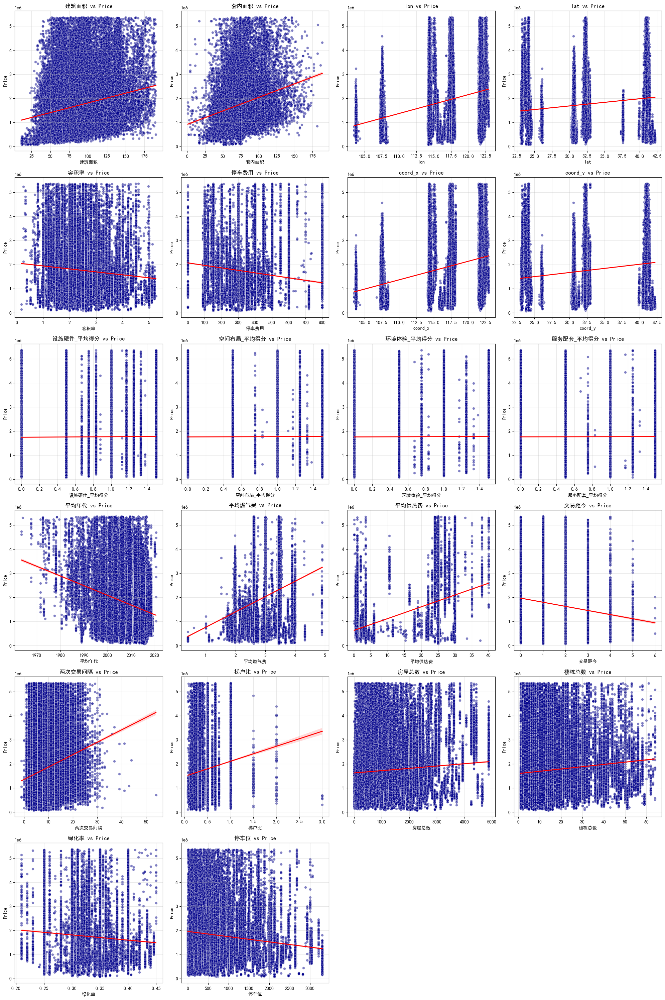

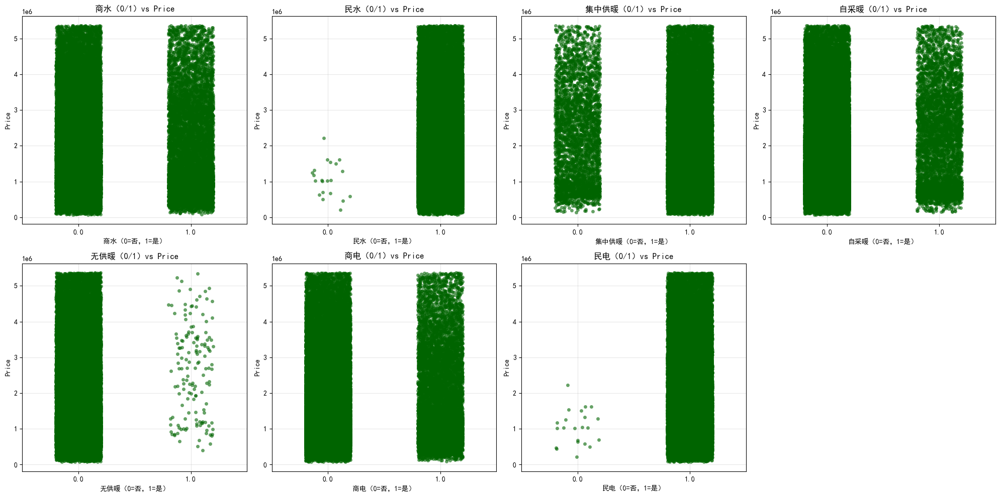

C:\Users\cnpc\AppData\Local\Temp\ipykernel_11068\2398566338.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=df_filtered, x=col, y='Price', ax=ax, jitter=0.3, alpha=0.6, size=4, palette='Set2')
C:\Users\cnpc\AppData\Local\Temp\ipykernel_11068\2398566338.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=df_filtered, x=col, y='Price', ax=ax, jitter=0.3, alpha=0.6, size=4, palette='Set2')
C:\Users\cnpc\AppData\Local\Temp\ipykernel_11068\2398566338.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=df_filtered, x=co

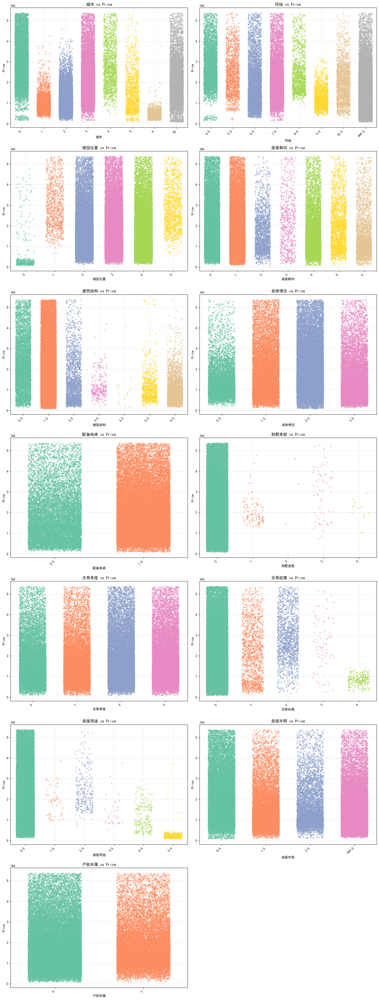

In [ ]:
plot_all_scatter(df_train_price_fill, df_Price, categorical_cols, continuous_cols, binary_cols)

In [ ]:
#依据城市缺失型添加
df_train_price_fill = df_train_price_fill.drop(['套内面积','板块'],axis=1)
df_train_price_fill['是否无环线'] = (df_train_price_fill['城市'].isin([1,2,3,5,6,7,8,9,10,11])).astype(int)
df_train_price_fill['是否无暖气'] = (~df_train_price_fill['城市'].isin([0,1,2,4,6,11])).astype(int)
df_train_price_fill['是否无房屋年限'] = (df_train_price_fill['城市'].isin([3,5,6,7,8,9,11])).astype(int)
df_train_price_fill['是否无绿化率_停车位_平均燃气费'] = (df_train_price_fill['城市'].isin([3,9])).astype(int)
df_train_price_fill['是否无停车费用'] = (df_train_price_fill['城市'].isin([3,6,9])).astype(int)
df_train_price_fill['是否无交易权属'] = (df_train_price_fill['城市'].isin([7,8])).astype(int)
df_train_price_fill['是否无房屋楼栋和社区位置'] = (df_train_price_fill['城市'].isin([9])).astype(int)
df_train_price_fill['是否无两次交易间隔'] = (df_train_price_fill['城市'].isin([5,6,8,9,11])).astype(int)
df_train_price_fill['是否无平均年代'] = (df_train_price_fill['城市'].isin([3,5,9])).astype(int)


In [ ]:

#转化平均年代至今
df_train_price_fill['平均年代'] = 2026-df_train_price_fill['平均年代']

In [ ]:
categorical_cols=['城市','区域','环线','楼层位置','房屋朝向', '建筑结构', '装修情况', '别墅类型','交易季度', '交易权属','房屋用途', '房屋年限']  # 需要转换的分类变量列

for col in categorical_cols:
    df_train_price_fill[col] = df_train_price_fill[col].astype('category')

# 2. 生成哑变量：对每个分类变量，生成k-1个哑变量
df_dummies = pd.get_dummies(
    df_train_price_fill, 
    columns=categorical_cols,  # 需要转换的分类变量列
    drop_first=True,  # 删除第一个类别（作为参照组）
    prefix=categorical_cols  # 哑变量前缀（方便区分）
)

In [ ]:
def apply_log_transform(df, cols_to_log):
    """
    对指定列进行自然对数转换（ln），处理非正值以避免错误
    
    :param df: 输入DataFrame（如df_dummies）
    :param cols_to_log: 需要取对数的列名列表（如['面积', '房价']）
    :param offset: 偏移量，用于处理非正值（如0或负数），默认+1（确保转换后的值>0）
    :return: 新增对数转换列的DataFrame（不修改原列）
    """
    # 复制数据，避免修改原始数据
    df_transformed = df.copy()
    
    # 2. 对每列进行对数转换
    for col in cols_to_log:
        # 提取原始列
        original = df_transformed[col]
        
        # 3. 计算自然对数（ln），新增列名：原列名 + "_log"
        log_col = f"{col}_log"
        df_transformed[log_col] = np.log(original+1)
        print(f"已对列'{col}'完成自然对数转换，新增列：{log_col}")
    
    return df_transformed

In [ ]:
cols_to_log = ['建筑面积','房屋总数','停车位','停车费用','楼栋总数','平均年代','容积率','平均供热费']
df_params = apply_log_transform(df_dummies,cols_to_log)

已对列'建筑面积'完成自然对数转换，新增列：建筑面积_log
已对列'房屋总数'完成自然对数转换，新增列：房屋总数_log
已对列'停车位'完成自然对数转换，新增列：停车位_log
已对列'停车费用'完成自然对数转换，新增列：停车费用_log
已对列'楼栋总数'完成自然对数转换，新增列：楼栋总数_log
已对列'平均年代'完成自然对数转换，新增列：平均年代_log
已对列'容积率'完成自然对数转换，新增列：容积率_log
已对列'平均供热费'完成自然对数转换，新增列：平均供热费_log


In [ ]:
# 生成交乘项
def generate_interactions(df, cols):
    """
    生成指定列中“第一项与其他项”的交乘项（仅第一项×第二项、第一项×第三项...）
    
    :param df: 原始DataFrame
    :param cols: 列名列表（第一项为基准因子，后续项为与基准因子相乘的列）
    :return: 包含原始列和新增交乘项的DataFrame
    """
    # 复制原始数据，避免修改输入
    df_new = df.copy()
    
    # 检查输入列是否为数值型（交乘项需数值型）
    non_numeric_cols = [col for col in cols if not pd.api.types.is_numeric_dtype(df_new[col])]
    if non_numeric_cols:
        raise TypeError(f"以下列不是数值型，无法生成交乘项：{non_numeric_cols}（请确保列是int/float类型）")
    
    # 提取基准因子（第一项）和需要与之相乘的列（第二项到最后一项）
    base_factor = cols[0]  # 第一个因子
    other_factors = cols[1:]  # 后续需要相乘的因子
    
    # 5. 生成交乘项
    for factor in other_factors:
        interaction_name = f"{base_factor}_{factor}"  # 交乘项命名：基准因子_其他因子
        df_new[interaction_name] = df_new[base_factor] * df_new[factor]
        print(f"已生成交乘项：{interaction_name}")
    
    return df_new

In [ ]:
df_params = generate_interactions(df_params,cols = ['是否无环线','环线_1.0', '环线_2.0', '环线_3.0', '环线_4.0', '环线_5.0', '环线_6.0', '环线_7.0', '环线_8.0', '环线_10.0','环线_999.0'])
df_params = generate_interactions(df_params,cols = ['是否无交易权属','交易权属_1', '交易权属_2', '交易权属_3', '交易权属_4'])
df_params = generate_interactions(df_params,cols = ['是否无房屋年限','房屋年限_1.0', '房屋年限_2.0','房屋年限_999.0'])
df_params = generate_interactions(df_params,cols = ['是否无房屋楼栋和社区位置','房屋总数_log', '楼栋总数_log'])
df_params = generate_interactions(df_params,cols = ['是否无绿化率_停车位_平均燃气费','绿化率', '容积率_log', '商水', '民水', '集中供暖', '自采暖', '商电', '民电', '停车位_log', '停车费用_log','平均燃气费'])
df_params = generate_interactions(df_params,cols = ['是否无停车费用', '停车费用_log'])
df_params = generate_interactions(df_params,cols = ['是否无暖气', '集中供暖', '自采暖', '平均供热费_log'])
df_params = generate_interactions(df_params,cols = ['是否无平均年代', '平均年代_log'])
df_params = generate_interactions(df_params,cols = ['是否无两次交易间隔', '两次交易间隔'])


已生成交乘项：是否无环线_环线_1.0
已生成交乘项：是否无环线_环线_2.0
已生成交乘项：是否无环线_环线_3.0
已生成交乘项：是否无环线_环线_4.0
已生成交乘项：是否无环线_环线_5.0
已生成交乘项：是否无环线_环线_6.0
已生成交乘项：是否无环线_环线_7.0
已生成交乘项：是否无环线_环线_8.0
已生成交乘项：是否无环线_环线_10.0
已生成交乘项：是否无环线_环线_999.0
已生成交乘项：是否无交易权属_交易权属_1
已生成交乘项：是否无交易权属_交易权属_2
已生成交乘项：是否无交易权属_交易权属_3
已生成交乘项：是否无交易权属_交易权属_4
已生成交乘项：是否无房屋年限_房屋年限_1.0
已生成交乘项：是否无房屋年限_房屋年限_2.0
已生成交乘项：是否无房屋年限_房屋年限_999.0
已生成交乘项：是否无房屋楼栋和社区位置_房屋总数_log
已生成交乘项：是否无房屋楼栋和社区位置_楼栋总数_log
已生成交乘项：是否无绿化率_停车位_平均燃气费_绿化率
已生成交乘项：是否无绿化率_停车位_平均燃气费_容积率_log
已生成交乘项：是否无绿化率_停车位_平均燃气费_商水
已生成交乘项：是否无绿化率_停车位_平均燃气费_民水
已生成交乘项：是否无绿化率_停车位_平均燃气费_集中供暖
已生成交乘项：是否无绿化率_停车位_平均燃气费_自采暖
已生成交乘项：是否无绿化率_停车位_平均燃气费_商电
已生成交乘项：是否无绿化率_停车位_平均燃气费_民电
已生成交乘项：是否无绿化率_停车位_平均燃气费_停车位_log
已生成交乘项：是否无绿化率_停车位_平均燃气费_停车费用_log
已生成交乘项：是否无绿化率_停车位_平均燃气费_平均燃气费
已生成交乘项：是否无停车费用_停车费用_log
已生成交乘项：是否无暖气_集中供暖
已生成交乘项：是否无暖气_自采暖
已生成交乘项：是否无暖气_平均供热费_log
已生成交乘项：是否无平均年代_平均年代_log
已生成交乘项：是否无两次交易间隔_两次交易间隔


In [ ]:
df_params = generate_interactions(df_params,cols = ['配备电梯', '梯户比'])
df_params = generate_interactions(df_params,cols = ['建筑面积_log','别墅类型_1', '别墅类型_2', '别墅类型_3', '别墅类型_5'])
df_params = generate_interactions(df_params,cols = ['配备电梯', '楼层位置_1', '楼层位置_2', '楼层位置_3', '楼层位置_4', '楼层位置_5','总层数','建筑面积_log'])

已生成交乘项：配备电梯_梯户比
已生成交乘项：建筑面积_log_别墅类型_1
已生成交乘项：建筑面积_log_别墅类型_2
已生成交乘项：建筑面积_log_别墅类型_3
已生成交乘项：建筑面积_log_别墅类型_5
已生成交乘项：配备电梯_楼层位置_1
已生成交乘项：配备电梯_楼层位置_2
已生成交乘项：配备电梯_楼层位置_3
已生成交乘项：配备电梯_楼层位置_4
已生成交乘项：配备电梯_楼层位置_5
已生成交乘项：配备电梯_总层数
已生成交乘项：配备电梯_建筑面积_log


In [ ]:
# 对Price做对数化处理
df_Y = np.log(df_Price)
# 去除X中对Y影响不明显的部分，以及去除对数化前原始变量列
df_params = df_params.drop(['coord_x', 'coord_y','建筑面积','房屋总数','停车位','停车费用','无供暖','平均年代','容积率','平均供热费','lon','lat'],axis=1)
df_X = df_params.copy()

In [ ]:
#考虑到区域列样本和测试集有所不同，加入一列
df_X['others'] = False

In [ ]:
# 防止回归报错
for col in df_X.columns:
        # pd.to_numeric：将列转为数值型，errors='coerce'表示非数值转为NaN
        df_X[col] = pd.to_numeric(df_X[col])
        
        # 转换为float类型（确保即使原是int，也统一为float）
        df_X[col] = df_X[col].astype(float)

In [ ]:
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
df_X_with_const = sm.add_constant(df_X)  # 新增一列常数项
# 划分训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(df_X_with_const, df_Y, test_size=0.2, random_state=42, shuffle=True)

OLS Regression for house price

In [ ]:
# 构建并拟合模型
model = sm.OLS(y_train, X_train).fit()

In [ ]:
# OLS回归MAE
y_pred = model.predict(X_train)
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(np.exp(y_train), np.exp(y_pred))
print('训练集MAE: '+str(mae))
y_pred = model.predict(X_test)
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(np.exp(y_test), np.exp(y_pred))
print('测试集MAE: '+str(mae))

训练集MAE: 310241.2654227286
测试集MAE: 308818.9920464454


In [ ]:
#六折交叉验证
from sklearn.model_selection import KFold  # 用于分割交叉验证集
from sklearn.metrics import mean_absolute_error, r2_score  # 评估指标

kf = KFold(n_splits=6, shuffle=True, random_state=42)

# 存储每次验证的指标
cv_metrics = {
    'train_r2': [],    # 训练集R²
    'val_r2': [],      # 验证集R²
    'train_mae': [],   # 训练集MAE
    'val_mae': []      # 验证集MAE
}

for fold, (train_idx, val_idx) in enumerate(kf.split(df_X), 1):
    print(f"===== 第{fold}折 =====")
    
    # 分割训练集和验证集
    X_train, X_val = df_X.iloc[train_idx], df_X.iloc[val_idx]  # 自变量
    y_train, y_val = df_Y.iloc[train_idx], df_Y.iloc[val_idx]  # 因变量
    
    # 添加常数项（OLS必需）
    X_train_with_const = sm.add_constant(X_train)
    X_val_with_const = sm.add_constant(X_val)
    
    # 拟合OLS模型（用训练集）
    model = sm.OLS(y_train, X_train_with_const).fit()
    
    # 在训练集和验证集上预测
    y_train_pred = model.predict(X_train_with_const)
    y_val_pred = model.predict(X_val_with_const)
    
    # 计算评估指标
    train_r2 = r2_score(y_train, y_train_pred)
    val_r2 = r2_score(y_val, y_val_pred)
    train_mae = mean_absolute_error(np.exp(y_train), np.exp(y_train_pred))
    val_mae = mean_absolute_error(np.exp(y_val), np.exp(y_val_pred))
    
    # 存储指标
    cv_metrics['train_r2'].append(train_r2)
    cv_metrics['val_r2'].append(val_r2)
    cv_metrics['train_mae'].append(train_mae)
    cv_metrics['val_mae'].append(val_mae)
    
    # 打印当前折的结果
    print(f"训练集R²：{train_r2:.4f}，验证集R²：{val_r2:.4f}")
    print(f"训练集MAE：{train_mae:.4f}，验证集MAE：{val_mae:.4f}\n")

    cv_results = pd.DataFrame({
    '指标': ['平均训练R²', '平均验证R²', '训练R²标准差', '验证R²标准差',
            '平均训练MAE', '平均验证MAE', '训练MAE标准差', '验证MAE标准差'],
    '数值': [
        np.mean(cv_metrics['train_r2']),
        np.mean(cv_metrics['val_r2']),
        np.std(cv_metrics['train_r2']),
        np.std(cv_metrics['val_r2']),
        np.mean(cv_metrics['train_mae']),
        np.mean(cv_metrics['val_mae']),
        np.std(cv_metrics['train_mae']),
        np.std(cv_metrics['val_mae'])
    ]
})

===== 第1折 =====
训练集R²：0.8751，验证集R²：0.8757
训练集MAE：310100.0274，验证集MAE：308764.4121

===== 第2折 =====
训练集R²：0.8764，验证集R²：0.8691
训练集MAE：309518.0524，验证集MAE：311044.6217

===== 第3折 =====
训练集R²：0.8750，验证集R²：0.8762
训练集MAE：309550.2035，验证集MAE：311467.0098

===== 第4折 =====
训练集R²：0.8750，验证集R²：0.8765
训练集MAE：310485.9329，验证集MAE：307215.8272

===== 第5折 =====
训练集R²：0.8758，验证集R²：0.8724
训练集MAE：309283.9629，验证集MAE：313345.2125

===== 第6折 =====
训练集R²：0.8752，验证集R²：0.8755
训练集MAE：308893.4154，验证集MAE：314534.6453



In [ ]:
print("===== 六折交叉验证结果汇总 =====")
print(cv_results.round(4))

===== 六折交叉验证结果汇总 =====
         指标           数值
0    平均训练R²       0.8754
1    平均验证R²       0.8742
2   训练R²标准差       0.0005
3   验证R²标准差       0.0027
4   平均训练MAE  309638.5991
5   平均验证MAE  311061.9548
6  训练MAE标准差     521.9038
7  验证MAE标准差    2500.2871


In [ ]:
#df_X.to_csv('train_price_X.csv',index = False)
#df_Y.to_csv('trian_price_Y.csv',index = False)

In [ ]:
import joblib
joblib.dump(model, 'OLS_Price_model.pkl')

['OLS_Price_model.pkl']

In [ ]:
print(df_dummies.columns.tolist())

['室数', '厅数', '厨数', '卫数', '总层数', '建筑面积', '配备电梯', '产权所属', 'lon', 'lat', '房屋总数', '楼栋总数', '绿化率', '容积率', '商水', '民水', '集中供暖', '自采暖', '无供暖', '商电', '民电', '停车位', '停车费用', 'coord_x', 'coord_y', '设施硬件_平均得分', '空间布局_平均得分', '环境体验_平均得分', '服务配套_平均得分', '平均年代', '平均燃气费', '平均供热费', '交易距今', '两次交易间隔', '梯户比', '是否无环线', '是否无暖气', '是否无房屋年限', '是否无绿化率_停车位_平均燃气费', '是否无停车费用', '是否无交易权属', '是否无房屋楼栋和社区位置', '是否无两次交易间隔', '是否无平均年代', '城市_1', '城市_2', '城市_3', '城市_4', '城市_5', '城市_6', '城市_7', '城市_8', '城市_9', '城市_10', '城市_11', '区域_4', '区域_5', '区域_7', '区域_8', '区域_9', '区域_10', '区域_11', '区域_12', '区域_13', '区域_14', '区域_15', '区域_16', '区域_17', '区域_18', '区域_19', '区域_20', '区域_21', '区域_22', '区域_23', '区域_24', '区域_26', '区域_27', '区域_28', '区域_29', '区域_30', '区域_31', '区域_32', '区域_33', '区域_34', '区域_35', '区域_36', '区域_37', '区域_38', '区域_39', '区域_41', '区域_42', '区域_43', '区域_44', '区域_45', '区域_46', '区域_47', '区域_49', '区域_50', '区域_51', '区域_52', '区域_53', '区域_54', '区域_55', '区域_56', '区域_57', '区域_58', '区域_59', '区域_60', '区域_62', '区域_63', '区域_64', '区域_65', '区域_6

In [ ]:
print(df_X_with_const.columns.tolist())

['室数', '厅数', '厨数', '卫数', '总层数', '配备电梯', '产权所属', '楼栋总数', '绿化率', '商水', '民水', '集中供暖', '自采暖', '商电', '民电', '设施硬件_平均得分', '空间布局_平均得分', '环境体验_平均得分', '服务配套_平均得分', '平均燃气费', '交易距今', '两次交易间隔', '梯户比', '是否无环线', '是否无暖气', '是否无房屋年限', '是否无绿化率_停车位_平均燃气费', '是否无停车费用', '是否无交易权属', '是否无房屋楼栋和社区位置', '是否无两次交易间隔', '是否无平均年代', '城市_1', '城市_2', '城市_3', '城市_4', '城市_5', '城市_6', '城市_7', '城市_8', '城市_9', '城市_10', '城市_11', '区域_4', '区域_5', '区域_7', '区域_8', '区域_9', '区域_10', '区域_11', '区域_12', '区域_13', '区域_14', '区域_15', '区域_16', '区域_17', '区域_18', '区域_19', '区域_20', '区域_21', '区域_22', '区域_23', '区域_24', '区域_26', '区域_27', '区域_28', '区域_29', '区域_30', '区域_31', '区域_32', '区域_33', '区域_34', '区域_35', '区域_36', '区域_37', '区域_38', '区域_39', '区域_41', '区域_42', '区域_43', '区域_44', '区域_45', '区域_46', '区域_47', '区域_49', '区域_50', '区域_51', '区域_52', '区域_53', '区域_54', '区域_55', '区域_56', '区域_57', '区域_58', '区域_59', '区域_60', '区域_62', '区域_63', '区域_64', '区域_65', '区域_66', '区域_67', '区域_68', '区域_69', '区域_70', '区域_71', '区域_72', '区域_73', '区域_74', '区域_76', '区域_77', '区域_

In [ ]:
import pandas as pd
import statsmodels.api as sm
# 导入经过相同处理得到的测试集
X_test = pd.read_csv('test_price_X.csv')
print(X_test.columns.tolist())

['室数', '厅数', '厨数', '卫数', '总层数', '配备电梯', '产权所属', '楼栋总数', '绿化率', '商水', '民水', '集中供暖', '自采暖', '商电', '民电', '设施硬件_平均得分', '空间布局_平均得分', '环境体验_平均得分', '服务配套_平均得分', '平均燃气费', '交易距今', '两次交易间隔', '梯户比', '是否无环线', '是否无暖气', '是否无房屋年限', '是否无绿化率_停车位_平均燃气费', '是否无停车费用', '是否无交易权属', '是否无房屋楼栋和社区位置', '是否无两次交易间隔', '是否无平均年代', '城市_1', '城市_2', '城市_3', '城市_4', '城市_5', '城市_6', '城市_7', '城市_8', '城市_9', '城市_10', '城市_11', '区域_4', '区域_5', '区域_7', '区域_8', '区域_9', '区域_10', '区域_11', '区域_12', '区域_13', '区域_14', '区域_15', '区域_16', '区域_17', '区域_18', '区域_19', '区域_20', '区域_21', '区域_22', '区域_23', '区域_24', '区域_26', '区域_27', '区域_28', '区域_29', '区域_30', '区域_31', '区域_32', '区域_33', '区域_34', '区域_35', '区域_36', '区域_37', '区域_38', '区域_39', '区域_41', '区域_42', '区域_43', '区域_44', '区域_45', '区域_46', '区域_47', '区域_49', '区域_50', '区域_51', '区域_52', '区域_53', '区域_54', '区域_55', '区域_56', '区域_57', '区域_58', '区域_59', '区域_60', '区域_62', '区域_63', '区域_64', '区域_65', '区域_66', '区域_67', '区域_68', '区域_69', '区域_70', '区域_71', '区域_72', '区域_73', '区域_74', '区域_76', '区域_77', '区域_

In [ ]:
y_pred = model.predict(X_test)
# 将预测值还原
y_pred_exp = []

# 1. 若y_pred是单个浮点数（标量）
if isinstance(y_pred, float):
    y_pred_exp.append(np.exp(y_pred))  # 直接对单个值做指数化

# 2. 若y_pred是可迭代对象（如列表、numpy数组、pandas Series等）
else:
    for val in y_pred:  # 遍历每个元素
        # 确保val是数值类型（避免非数值导致错误）
        if isinstance(val, (int, float)):
            y_pred_exp.append(np.exp(val))
        else:
            # 处理异常值（如None、字符串等，根据实际情况调整）
            y_pred_exp.append(np.nan)  # 或其他默认值

# 转换为numpy数组（可选，方便后续计算）
y_pred_exp = np.array(y_pred_exp)
y_test_1 = pd.Series(y_pred_exp)
y_test_1.to_csv('test_price_Y.csv',index=False)

Data processing for the rent data

In [ ]:
import pandas as pd
import numpy as np
import re

In [ ]:
df_train_rent = pd.read_csv('../data_origin/ruc_Class25Q2_train_rent.csv')

C:\Users\cnpc\AppData\Local\Temp\ipykernel_18236\3598345244.py:1: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  df_train_rent = pd.read_csv('../data_origin/ruc_Class25Q2_train_rent.csv')


In [ ]:
columns = ['城市', '户型', '装修', 'Price', '楼层', '面积', '朝向', '交易时间', '付款方式', '租赁方式',
       '电梯', '车位', '用水', '用电', '燃气', '采暖', '租期', '配套设施', 'lon', 'lat', '年份',
       '区县', '板块', '环线位置', '物业类别', '建筑年代', '开发商', '房屋总数', '楼栋总数', '物业公司',
       '绿 化 率', '容 积 率', '物 业 费', '建筑结构', '物业办公电话', '产权描述', '供水', '供暖', '供电',
       '燃气费', '供热费', '停车位', '停车费用', 'coord_x', 'coord_y', '客户反馈']

df_chengshi = df_train_rent['城市']
df_huxing = df_train_rent['户型']
df_zhuangxiu = df_train_rent['装修']
df_Price = df_train_rent['Price']
df_louceng = df_train_rent['楼层']
df_mianji = df_train_rent['面积']
df_chaoxiang = df_train_rent['朝向']
df_jiaoyishijian = df_train_rent['交易时间']
df_fukuanfangshi = df_train_rent['付款方式']
df_zulinfangshi = df_train_rent['租赁方式']
df_dianti = df_train_rent['电梯']
df_chewei = df_train_rent['车位']
df_yongshui = df_train_rent['用水']
df_yongdian = df_train_rent['用电']
df_ranqi = df_train_rent['燃气']
df_cainuan = df_train_rent['采暖']
df_zuqi = df_train_rent['租期']
df_peitaosheshi = df_train_rent['配套设施']
df_lon = df_train_rent['lon']
df_lat = df_train_rent['lat']
df_nianfen = df_train_rent['年份']
df_quxian = df_train_rent['区县']
df_bankuai = df_train_rent['板块']
df_huanxianweizhi = df_train_rent['环线位置']
df_wuyeleibie = df_train_rent['物业类别']
df_jianzhuniandai = df_train_rent['建筑年代']
df_kaifashang = df_train_rent['开发商']
df_fangwuzongshu = df_train_rent['房屋总数']
df_loudongzongshu = df_train_rent['楼栋总数']
df_wuyegongsi = df_train_rent['物业公司']
df_lvhualv = df_train_rent['绿 化 率']
df_rongjilv = df_train_rent['容 积 率']
df_wuyefei = df_train_rent['物 业 费']
df_jianzhujiegou = df_train_rent['建筑结构']
df_wuyebangongdianhua = df_train_rent['物业办公电话']
df_chanquanmiaoshu = df_train_rent['产权描述']
df_gongshui = df_train_rent['供水']
df_gongnuan = df_train_rent['供暖']
df_gongdian = df_train_rent['供电']
df_ranqifei = df_train_rent['燃气费']
df_gongrefei = df_train_rent['供热费']
df_tingchewei = df_train_rent['停车位']
df_tingchefeiyong = df_train_rent['停车费用']
df_coord_x = df_train_rent['coord_x']
df_coord_y = df_train_rent['coord_y']
df_kehufankui = df_train_rent['客户反馈']

In [ ]:
def parse_house_type(house_type):
    """
    解析户型字符串，提取室数、厅数、卫数
    返回：[室数, 厅数, 卫数]，无法识别则为NaN
    """
    # 处理空值
    if pd.isna(house_type):
        return [np.nan, np.nan, np.nan]
    
    # 转换为字符串并清洗（去除空格）
    s = str(house_type).strip().replace(" ", "")
    
    # 定义正则模式（匹配“数字+关键词”）
    # 室数：匹配“数字+室”“数字+房间”“数字+居室”
    room_pattern = r'(\d+)(室|房间|居室)'
    # 厅数：匹配“数字+厅”
    hall_pattern = r'(\d+)厅'
    # 卫数：匹配“数字+卫”
    toilet_pattern = r'(\d+)卫'
    
    # 提取室数（默认0，若未找到且有其他关键词则为0，完全无匹配则NaN）
    room_match = re.search(room_pattern, s)
    room = int(room_match.group(1)) if room_match else 0
    
    # 提取厅数
    hall_match = re.search(hall_pattern, s)
    hall = int(hall_match.group(1)) if hall_match else 0
    
    # 提取卫数
    toilet_match = re.search(toilet_pattern, s)
    toilet = int(toilet_match.group(1)) if toilet_match else 0
    
    # 判断是否为完全无法识别的非法字段（无任何数字+关键词组合）
    if room == 0 and hall == 0 and toilet == 0:
        return [np.nan, np.nan, np.nan]
    
    return [room, hall, toilet]

# 应用函数解析户型
df_huxing = df_huxing.apply(parse_house_type).apply(pd.Series)
df_huxing.columns = ["室数", "厅数", "卫数"]
df_huxing

,室数,厅数,卫数
0,1.0,1.0,1.0
1,1.0,1.0,1.0
2,1.0,1.0,1.0
3,3.0,1.0,2.0
4,1.0,1.0,1.0
...,...,...,...
98894,3.0,2.0,0.0
98895,3.0,2.0,0.0
98896,2.0,2.0,0.0
98897,2.0,1.0,0.0


In [ ]:
# 假设所有空值都为“非精装修”，因为精装修占比约25%
df_zhuangxiu = df_zhuangxiu.replace({"精装修": 1,np.nan:0})
df_zhuangxiu = pd.DataFrame(df_zhuangxiu)
df_zhuangxiu

C:\Users\cnpc\AppData\Local\Temp\ipykernel_18236\3258299666.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_zhuangxiu = df_zhuangxiu.replace({"精装修": 1,np.nan:0})


,装修
0,1.0
1,1.0
2,1.0
3,1.0
4,1.0
...,...
98894,0.0
98895,0.0
98896,0.0
98897,0.0


In [ ]:
# 处理楼层，转化为文字形式，所处楼层除以总楼层的比例界定低、中、高楼层
level = []
for s in df_louceng:
    if pd.isna(s):
        level.append([np.nan,np.nan])
        continue
    cleaned_s = str(s).strip().replace(" ", "")
    if "/" not in cleaned_s:
        level.append([np.nan,np.nan])
        continue
    # 只分割一次
    parts = cleaned_s.split("/", 1)

    total_match = re.search(r'(\d+)', parts[1])
    if total_match:
        total_floor = int(total_match.group(1))
    else:
        level.append([np.nan,np.nan])
        continue

    current_num_match = re.search(r'^(\d+)$', parts[0])
    if current_num_match:
        current_num = int(current_num_match.group(1))
    
    # 按比例界定
    if current_num_match:
        if current_num == total_floor:
            current_desc = "顶层"
        else:
            # 按比例界定低、中、高楼层
            ratio = current_num / total_floor
            if ratio < 1/3:
                current_desc = "低楼层"
            elif ratio < 2/3:
                current_desc = "中楼层"
            else:
                current_desc = "高楼层"
    else:
        # 当不需要使用数据界定时
        current_desc = parts[0]
    level.append([current_desc,total_floor])
df_louceng = pd.DataFrame(level)
df_louceng.columns = ["楼层位置", "总层数"]
df_louceng['楼层位置'] = df_louceng['楼层位置'].replace({"低楼层": 0,'中楼层':1,'高楼层':2,'顶层':3})
df_louceng    

,楼层位置,总层数
0,2,6.0
1,2,6.0
2,0,18.0
3,0,10.0
4,3,18.0
...,...,...
98894,2,11.0
98895,2,11.0
98896,0,17.0
98897,1,16.0


In [ ]:
mianji = []
for s in df_mianji:
    match = re.search(r'(\d+\.?\d*)㎡', s)
    if match:
        area = float(match.group(1))
    else:
        area = np.nan
    mianji.append([area])
df_mianji = pd.DataFrame(mianji)
columns = ['面积']
df_mianji.columns = columns
df_mianji

,面积
0,36.42
1,41.00
2,37.36
3,55.42
4,49.30
...,...
98894,123.00
98895,123.00
98896,100.00
98897,98.00


In [ ]:
direction_map = {
    '东': ['东'],
    '南': ['南'],
    '西': ['西'],
    '北': ['北'],
    '东南': ['东', '南'],
    '西南': ['西', '南'],
    '东北': ['东', '北'],
    '西北': ['西', '北']
}

def get_base_directions(s):
    """将朝向字符串拆分为所有包含的基础方向（东/南/西/北）"""
    if pd.isna(s):
        return []
    # 按空格拆分原始朝向
    dir_elements = s.split(' ')
    # 提取基础方向
    base_dirs = []
    for elem in dir_elements:
        # 从映射表中获取基础方向
        base_dirs.extend(direction_map.get(elem, []))
    base_dirs_unique = list(set(base_dirs))
    order = ['东', '南', '西', '北']
    base_dirs_sorted = sorted(base_dirs_unique, key=lambda x: order.index(x))
    return ' '.join(base_dirs_sorted)

# 将基础朝向转换为主要朝向，并用数字编码
def categorize_direction(standardized_dir):
    if pd.isna(standardized_dir):
        return np.nan
    
    dir_list = standardized_dir
    has_south = '南' in dir_list
    has_north = '北' in dir_list
    has_east = '东' in dir_list
    has_west = '西' in dir_list
    
    # 南北通透（同时有南和北）
    if has_south and has_north:
        return 0
    # 纯南向（只有南）
    if has_south and not has_north and not has_east and not has_west:
        return 1
    # 纯北向（只有北）
    if has_north and not has_south and not has_east and not has_west:
        return 2
    # 东西向（有东和西，无南和北）
    if has_east and has_west and not has_south and not has_north:
        return 3
    # 南向为主（有南，无北）
    if has_south and not has_north:
        return 4
    # 北向为主（有北，无南）
    if has_north and not has_south:
        return 5
    # 其他组合
    return 6

df_chaoxiang = df_chaoxiang.apply(get_base_directions)
df_chaoxiang = df_chaoxiang.apply(categorize_direction)
df_chaoxiang = pd.DataFrame(df_chaoxiang)
columns = ['朝向']
df_chaoxiang.columns = columns
df_chaoxiang

C:\Users\cnpc\AppData\Local\Temp\ipykernel_18236\1799073386.py:30: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if pd.isna(standardized_dir):


,朝向
0,6
1,1
2,2
3,1
4,1
...,...
98894,0
98895,0
98896,1
98897,0


In [ ]:
# 交易年份保留年，月转化为季度
transaction_time = []
df_jiaoyishijian = pd.to_datetime(df_jiaoyishijian)
df_jiaoyinian = df_jiaoyishijian.dt.year
df_jiaoyiyue = df_jiaoyishijian.dt.month
jiaoyijidu = []
for s in df_jiaoyiyue:
    if (s >= 1) & (s <= 3):
        jiaoyijidu.append([0])
    elif (s >= 4) & (s <= 6):
        jiaoyijidu.append([1])
    elif (s >= 7) & (s <= 9):
        jiaoyijidu.append([2])
    elif (s >= 10) & (s <= 12):
        jiaoyijidu.append([3])
    else:
        jiaoyijidu.append([np.nan])
df_jiaoyijidu = pd.DataFrame(jiaoyijidu)
df_jiaoyishijian = pd.concat([df_jiaoyinian,df_jiaoyijidu],axis=1)
columns = ['交易年','交易季度']
df_jiaoyishijian.columns = columns
df_jiaoyishijian

,交易年,交易季度
0,2024,3
1,2024,3
2,2024,3
3,2024,3
4,2024,3
...,...,...
98894,2024,1
98895,2024,1
98896,2024,1
98897,2024,1


In [ ]:
df_fukuanfangshi = df_fukuanfangshi.replace({'月付价': 0,'双月付价': 1,"季付价": 2,'半年付价': 3,'年付价': 4})
df_fukuanfangshi = pd.to_numeric(df_fukuanfangshi, errors='coerce') # 去除其他乱码值
df_fukuanfangshi = pd.DataFrame(df_fukuanfangshi)
df_fukuanfangshi

,付款方式
0,2.0
1,2.0
2,2.0
3,2.0
4,2.0
...,...
98894,2.0
98895,2.0
98896,0.0
98897,2.0


In [ ]:
df_zulinfangshi = df_zulinfangshi.replace({'整租': 1,'合租': 0})
df_zulinfangshi = pd.DataFrame(df_zulinfangshi)
df_zulinfangshi

C:\Users\cnpc\AppData\Local\Temp\ipykernel_18236\1145655553.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_zulinfangshi = df_zulinfangshi.replace({'整租': 1,'合租': 0})


,租赁方式
0,1
1,1
2,1
3,1
4,1
...,...
98894,1
98895,1
98896,1
98897,1


In [ ]:
df_dianti = df_dianti.replace({'无': 0,'有': 1})
df_dianti = pd.to_numeric(df_dianti, errors='coerce') # 去除其他乱码值
df_dianti = pd.DataFrame(df_dianti)
df_dianti

C:\Users\cnpc\AppData\Local\Temp\ipykernel_18236\3753068993.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_dianti = df_dianti.replace({'无': 0,'有': 1})


,电梯
0,0.0
1,0.0
2,1.0
3,1.0
4,1.0
...,...
98894,0.0
98895,0.0
98896,1.0
98897,1.0


In [ ]:
df_chewei = df_chewei.replace({'租用车位': 0,'免费使用': 1})
df_chewei = pd.to_numeric(df_chewei, errors='coerce') # 去除其他乱码值
df_chewei = pd.DataFrame(df_chewei)
df_chewei

C:\Users\cnpc\AppData\Local\Temp\ipykernel_18236\2853797295.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_chewei = df_chewei.replace({'租用车位': 0,'免费使用': 1})


,车位
0,NaN
1,NaN
2,0.0
3,0.0
4,NaN
...,...
98894,1.0
98895,1.0
98896,NaN
98897,0.0


In [ ]:
df_yongshui = df_yongshui.replace({'商水': 0,'民水': 1})
df_yongshui = pd.to_numeric(df_yongshui, errors='coerce') # 去除其他乱码值
df_yongshui = pd.DataFrame(df_yongshui)
df_yongshui

C:\Users\cnpc\AppData\Local\Temp\ipykernel_18236\1976887597.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_yongshui = df_yongshui.replace({'商水': 0,'民水': 1})


,用水
0,1.0
1,1.0
2,1.0
3,0.0
4,1.0
...,...
98894,1.0
98895,1.0
98896,1.0
98897,1.0


In [ ]:
df_yongdian = df_yongdian.replace({'商电': 0,'民电': 1})
df_yongdian = pd.to_numeric(df_yongdian, errors='coerce') # 去除其他乱码值
df_yongdian = pd.DataFrame(df_yongdian)
df_yongdian

C:\Users\cnpc\AppData\Local\Temp\ipykernel_18236\3738144913.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_yongdian = df_yongdian.replace({'商电': 0,'民电': 1})


,用电
0,1.0
1,1.0
2,1.0
3,0.0
4,1.0
...,...
98894,1.0
98895,1.0
98896,1.0
98897,1.0


In [ ]:
df_ranqi = df_ranqi.replace({'无': 0,'有': 1})
df_ranqi = pd.to_numeric(df_ranqi, errors='coerce') # 去除其他乱码值
df_ranqi = pd.DataFrame(df_ranqi)
df_ranqi

C:\Users\cnpc\AppData\Local\Temp\ipykernel_18236\4158611297.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_ranqi = df_ranqi.replace({'无': 0,'有': 1})


,燃气
0,1.0
1,1.0
2,1.0
3,0.0
4,1.0
...,...
98894,1.0
98895,1.0
98896,1.0
98897,1.0


In [ ]:
df_cainuan = df_cainuan.replace({'自采暖': 0,'集中供暖': 1})
df_cainuan = pd.to_numeric(df_cainuan, errors='coerce') # 去除其他乱码值
df_cainuan = pd.DataFrame(df_cainuan)
df_cainuan

C:\Users\cnpc\AppData\Local\Temp\ipykernel_18236\2632269202.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_cainuan = df_cainuan.replace({'自采暖': 0,'集中供暖': 1})


,采暖
0,1.0
1,1.0
2,1.0
3,1.0
4,1.0
...,...
98894,0.0
98895,0.0
98896,0.0
98897,0.0


In [ ]:
# 处理租期

# 定义一个函数用于把年转换月
def to_months(num, unit):
    if unit == "年":
        return num * 12
    elif unit == "月":
        return num
    elif unit == '个月':
        return num
    else:
        return np.nan  # 单位异常
    
rent_limit = []
for s in df_zuqi:
    if pd.isna(s):
        rent_limit.append([np.nan,np.nan])
        continue

    s = str(s).strip().replace(" ", "")

    exact_match = re.match(r'^(\d+)(年|个月)$', s)
    if exact_match: # 当租期明确的时候，上下限都一样
        num = int(exact_match.group(1))
        unit = exact_match.group(2)
        months = to_months(num, unit)
        rent_limit.append([months,months])
        continue

    range_match = re.match(r'^(\d+)~(\d+)(年|个月)$', s)
    if range_match:
        num1, num2, unit = range_match.groups()
        lower = to_months(int(num1), unit)
        upper = to_months(int(num2), unit)
        rent_limit.append([lower,upper])
        continue

    within_match = re.match(r'^(\d+)(年|个月)以内$', s)
    if within_match:
        num = int(within_match.group(1))
        unit = within_match.group(2)
        upper = to_months(num, unit)
        rent_limit.append([1,upper]) # X年或X月以内，最下界设为1月
        continue

    above_match = re.match(r'^(\d+)(年|个月)以上$', s)
    if above_match:
        num = int(above_match.group(1))
        unit = above_match.group(2)
        lower = to_months(num, unit)
        rent_limit.append([lower,np.nan]) # X年或X月以上，最下界设为NaN月，待后续处理
        continue
df_zuqi = pd.DataFrame(rent_limit)
df_zuqi.columns = ['租期下限','租期上限']


In [ ]:
df_zuqi

,租期下限,租期上限
0,12.0,12.0
1,NaN,NaN
2,NaN,NaN
3,5.0,12.0
4,12.0,12.0
...,...,...
98894,1.0,12.0
98895,1.0,12.0
98896,NaN,NaN
98897,1.0,12.0


In [ ]:
huanxianweizhi_bank = []
for s in df_huanxianweizhi:
    if pd.isna(s):
        continue
    huanxianweizhi_bank.append(s)
    huanxianweizhi_bank = set(huanxianweizhi_bank)
    huanxianweizhi_bank = list(huanxianweizhi_bank)

ring_mapping = {
    "二环内": 0,
    "二至三环": 1,
    "三至四环": 2,
    "四至五环": 3,
    "五至六环": 4,
    "六环外": 5,
    
    "内环内": 6,
    "内环至中环": 7,
    "中环至外环": 8,
    "内环至外环": 9,
    "外环外": 10
}

df_huanxianweizhi = df_huanxianweizhi.map(ring_mapping)
df_huanxianweizhi = pd.DataFrame(df_huanxianweizhi)
df_huanxianweizhi

,环线位置
0,2.0
1,1.0
2,2.0
3,5.0
4,2.0
...,...
98894,NaN
98895,NaN
98896,NaN
98897,NaN


In [ ]:
sheshi_bank = []
for s in df_peitaosheshi:
    if pd.isna(s):
        continue
    s = str(s).strip().replace(" ", "")
    s = s.split('、')
    sheshi_bank.extend(s)
    sheshi_bank = set(sheshi_bank)
    sheshi_bank = list(sheshi_bank)

# 定义函数：判断每行包含哪些设施
def get_facility_flags(facility_str):
    if pd.isna(facility_str):
        # 空值视为缺失
        return [np.nan] * len(sheshi_bank)
    # 拆分并清洗当前行的设施
    current_facilities = [f.strip() for f in str(facility_str).split("、")]
    # 判断每种设施是否存在
    flags = [1 if f in current_facilities else 0 for f in sheshi_bank]
    return flags

facility_index = df_peitaosheshi.apply(get_facility_flags)
# 转换为DataFrame并设置列名
facility_index = pd.DataFrame(facility_index.tolist())
facility_index.columns = sheshi_bank
try:
    df_peitaosheshi = facility_index.drop(columns=['', '天然'], inplace=False)
except:
    pass
df_peitaosheshi


,天然气,宽带,电视,衣柜,空调,暖气,热水器,冰箱,床,洗衣机
0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0
1,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0
2,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0
3,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...
98894,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0
98895,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0
98896,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
98897,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [ ]:
jianzhuniandai = []
for s in df_jianzhuniandai:
    if pd.isna(s): 
        jianzhuniandai.append([np.nan,np.nan]) 
        continue
    try:
        parts = s.split('-')
        match_start = parts[0]
        match_end = re.match(r'(\d+)', parts[1])
        jianzhuniandai.append([int(match_start),int(match_end.group(0))])
    except:
        match_end = re.match(r'(\d+)', s)
        jianzhuniandai.append([int(match_end.group(0)),int(match_end.group(0))])
df_jianzhuniandai = pd.DataFrame(jianzhuniandai)
columns = ['起始年代','终止年代']
df_jianzhuniandai.columns = columns
df_jianzhuniandai

,起始年代,终止年代
0,1963.0,2001.0
1,1988.0,2002.0
2,2004.0,2009.0
3,2015.0,2018.0
4,1980.0,1996.0
...,...,...
98894,2000.0,2012.0
98895,2000.0,2010.0
98896,2008.0,2015.0
98897,2008.0,2015.0


In [ ]:
hushu = []
for s in df_fangwuzongshu:
    if pd.isna(s): 
        hushu.append([np.nan]) 
        continue
    match = re.match(r'(\d+)', s)
    hushu.append([int(match.group(0))])
df_fangwuzongshu = pd.DataFrame(hushu)
columns = ['房屋总数']
df_fangwuzongshu.columns = columns
df_fangwuzongshu

,房屋总数
0,1731.0
1,1931.0
2,1891.0
3,3026.0
4,3031.0
...,...
98894,948.0
98895,167.0
98896,1285.0
98897,1285.0


In [ ]:
loudong = []
for s in df_loudongzongshu:
    if pd.isna(s): 
        loudong.append([np.nan]) 
        continue
    match = re.match(r'(\d+)', s)
    loudong.append([int(match.group(0))])
df_loudongzongshu = pd.DataFrame(loudong)
columns = ['楼栋总数']
df_loudongzongshu.columns = columns
df_loudongzongshu

,楼栋总数
0,19.0
1,9.0
2,12.0
3,10.0
4,27.0
...,...
98894,16.0
98895,6.0
98896,12.0
98897,12.0


In [ ]:
lvhua = []
for s in df_lvhualv:
    if pd.isna(s): 
        lvhua.append([np.nan]) 
        continue
    match = re.match(r'(\d+\.?\d*|\.\d+)', s)
    match_float = float(match.group(0))
    lvhua.append([match_float*0.01])
df_lvhualv = pd.DataFrame(lvhua)
columns = ['绿化率']
df_lvhualv.columns = columns
df_lvhualv

,绿化率
0,0.30
1,0.30
2,0.30
3,0.35
4,0.25
...,...
98894,0.50
98895,0.45
98896,0.30
98897,0.30


In [ ]:
wuyefei = []
for s in df_wuyefei:
    if pd.isna(s): 
        wuyefei.append([np.nan,np.nan]) 
        continue
    try:
        parts = s.split('-')
        match_start = float(parts[0])
        match_end = float((re.search(r'(\d+\.?\d*|\.\d+)', parts[1])).group(1))
        wuyefei.append([match_start,match_end])
    except:
        match_end = re.search(r'(\d+\.?\d*|\.\d+)', s)
        wuyefei.append([match_end.group(0),match_end.group(0)]) 
df_wuyefei = pd.DataFrame(wuyefei)
columns = ['物业费下限','物业费上限']
df_wuyefei.columns = columns
df_wuyefei

,物业费下限,物业费上限
0,1.1,1.85
1,0.6,1.15
2,2.0,2.66
3,1.5,4.9
4,0.8,1.2
...,...,...
98894,0.3,1.2
98895,19,19
98896,1.5,1.78
98897,1.5,1.78


In [ ]:
jianzhujiegou_bank = []
for s in df_jianzhujiegou:
    if pd.isna(s):
        continue
    s = str(s).strip().replace(" ", "")
    s = s.split('/')
    jianzhujiegou_bank.extend(s)
    jianzhujiegou_bank = set(jianzhujiegou_bank)
    jianzhujiegou_bank = list(jianzhujiegou_bank)

# 定义函数：判断每行包含哪些设施
def get_structure_flags(facility_str):
    if pd.isna(facility_str):
        # 空值视为缺失值
        return [np.nan] * len(jianzhujiegou_bank)
    # 拆分并清洗当前行的设施
    current_facilities = [f.strip() for f in str(facility_str).split("/")]
    # 判断每种设施是否存在
    flags = [1 if f in current_facilities else 0 for f in jianzhujiegou_bank]
    return flags

structure_index = df_jianzhujiegou.apply(get_structure_flags)
# 转换为DataFrame并设置列名
structure_index = pd.DataFrame(structure_index.tolist())
structure_index.columns = jianzhujiegou_bank
df_jianzhujiegou = structure_index.copy()
df_jianzhujiegou

,塔板结合,平房,板楼,塔楼
0,0.0,0.0,1.0,1.0
1,1.0,0.0,1.0,1.0
2,1.0,0.0,1.0,1.0
3,1.0,0.0,1.0,1.0
4,0.0,0.0,1.0,1.0
...,...,...,...,...
98894,0.0,0.0,1.0,0.0
98895,1.0,0.0,0.0,0.0
98896,1.0,0.0,0.0,1.0
98897,1.0,0.0,0.0,1.0


In [ ]:
ranqifei = []
for s in df_ranqifei:
    if pd.isna(s): 
        ranqifei.append([np.nan,np.nan]) 
        continue
    try:
        parts = s.split('-')
        match_start = float(parts[0])
        match_end = float((re.search(r'(\d+\.?\d*|\.\d+)', parts[1])).group(1))
        ranqifei.append([match_start,match_end])
    except:
        match_end = re.search(r'(\d+\.?\d*|\.\d+)', s)
        ranqifei.append([float(match_end.group(0)),float(match_end.group(0))]) 
df_ranqifei = pd.DataFrame(ranqifei)
columns = ['燃气费下限','燃气费上限']
df_ranqifei.columns = columns
df_ranqifei

,燃气费下限,燃气费上限
0,2.61,2.61
1,2.61,2.61
2,2.61,2.63
3,2.61,2.61
4,2.61,2.61
...,...,...
98894,2.40,2.68
98895,NaN,NaN
98896,2.68,2.68
98897,2.68,2.68


In [ ]:
gongrefei = []
for s in df_gongrefei:
    if pd.isna(s): 
        gongrefei.append([np.nan,np.nan]) 
        continue
    try:
        parts = s.split('-')
        match_start = float(parts[0])
        match_end = float((re.search(r'(\d+\.?\d*|\.\d+)', parts[1])).group(1))
        gongrefei.append([match_start,match_end])
    except:
        match_end = re.search(r'(\d+\.?\d*|\.\d+)', s)
        gongrefei.append([float(match_end.group(0)),float(match_end.group(0))]) 
df_gongrefei = pd.DataFrame(gongrefei)
columns = ['供热费下限','供热费上限']
df_gongrefei.columns = columns
df_gongrefei

,供热费下限,供热费上限
0,24.0,30.0
1,30.0,30.0
2,30.0,46.0
3,30.0,44.0
4,30.0,30.0
...,...,...
98894,18.0,18.0
98895,19.0,19.0
98896,NaN,NaN
98897,NaN,NaN


In [ ]:
def parse_parking_fee(fee_str):
    # 处理空值
    if pd.isna(fee_str):
        return np.nan
    
    cleaned = str(fee_str).strip().lower()
    if "免费" in cleaned:
        return 0.0
    
    num_match = re.search(r'(\d+\.?\d*)', cleaned)
    if not num_match:
        return np.nan  # 无数字→空值
    fee_num = float(num_match.group(1))  # 转换为数字
    
    # 根据数字范围判断周期并换算为月费
    # 规则：0.5~10 → 小时费；10~100 → 天费；其他→保留原值
    if 0.5 <= fee_num < 10:
        # 小时费换算月费
        monthly_fee = fee_num * 24 * 30
        return round(monthly_fee, 2)  # 保留2位小数
    elif 10 <= fee_num <= 80:
        # 天费换算月费
        monthly_fee = fee_num * 30
        return round(monthly_fee, 2)
    else:
        # 保留原值
        return round(fee_num, 2)
    
parking_fee = df_tingchefeiyong.apply(parse_parking_fee)
df_tingchefeiyong = pd.DataFrame(parking_fee)
df_tingchefeiyong.columns = ['停车费用']
df_tingchefeiyong

,停车费用
0,150.0
1,150.0
2,500.0
3,550.0
4,150.0
...,...
98894,0.0
98895,4320.0
98896,300.0
98897,300.0


In [ ]:
# ---------------------- 1. 标准化词典（同之前，确保无错误）
topic_keywords = {
    "设施硬件": ["光照","通风","网速","阳台","装修","照明灯","结构","厨房","储物","水","墙","窗户","空调","冷气","车库","厕所","浴室","楼体","灯光","排风口","水表","隔音","暖气","设备","房龄","房屋保养","楼板","配套","地砖","管道","采光","管线","地板","地面","家具","配置","天花板","热水","空气","地暖","网络","客厅","电","采暖","设施","外立面","信号","洗衣"],
    "空间布局": ["面积","布局","路况","地铁","楼间距","空间","风景","道路","房型","出行距离","位置","居住密度","地势","设计","景观","红绿灯","车位","停车","户型","人流量","街道","楼层","周边","视野","格局"],
    "环境体验": ["体验","素质","潮气","气味","交通","绿植","隔音","地段","绿化","通勤","公共区","卫生","银行","医院","生活圈","购物","社区商业","邻居","打车","垃圾","车流","邻里","建筑风格","社区秩序","园区","蚊虫","餐饮","商业配套","楼道","虫害","虫鼠","马路","小区","走廊"],
    "服务配套": ["服务","成熟度","安保","保安","维修","安防","管理","监控","智能","社区活动","条款","证件","价格","签约手续","合同","房东","看房","门禁","燃气费","信息","电费","保洁","物业","流程","治安","入住","停车费"]
}

positive_words = {"快","通透","稳定","时尚","预留","标准","顺畅","完善","新颖","舒适","充足","充裕","贴心","稳固","齐全","密封好","干爽","优","新","紧实","结实","考究","先进","用心","均衡","齐备","大","柔和","快捷","接入","流通","无遮挡","宽敞","实用","层高","规范","明确","合理","均匀","靠近","常见","良好","方正","优越","平坦","佳","开阔","临近","统一","平整","规整","紧凑","清新","新鲜","整洁","绿化好","率高","定期","排气","和谐","优美","现代","清理","干净","安静","清洁","友好","漂亮","丰富","高","接受","按时","好","清晰","节奏","方便","及时","沟通","严格","成熟","到位","安全","计量","保障","覆盖","便利","活动","强","独立","拎包","高效","正常","正规","常规","适中","普通","平均","中等","可接受","中档","一般"}

negative_words = {"老旧","松动","进风","漏水","渗水","裂","停用","坏","破损","异响","漏电","漏风","堵塞","不足","薄","不稳","不热","故障","不严","老化","低","遮挡","慢","暗","湿","远","离地铁","不便","拥挤","偏","刺鼻","噪音","堪忧","嘈杂","发黑","差","问题","闷","少","积灰","荒废","死角","难","返味","反味","杂乱","吵闹","堆放","多","纠纷","异味","油烟","发霉","脏乱","高","霸王","慢","隐患","拖延","推诿","违章","失效","陷阱","勉强","不清楚","偷工减料",'不畅'}

# ---------------------- 2. 核心处理函数（新增匹配次数+平均得分）
def calculate_topic_score_and_count(comment):
    """
    计算单条评论的4主题：得分、成功匹配次数、平均得分
    comment: 输入评论
    return: 字典（含得分、匹配次数、平均得分）
    """
    # 初始化：主题得分（0）、成功匹配次数（0）
    topic_scores = {topic: 0.0 for topic in topic_keywords.keys()}
    topic_match_count = {topic: 0 for topic in topic_keywords.keys()}  # 新增：成功匹配次数
    
    try:
        # 步骤1：切分子块并过滤无效值
        sub_blocks = [block.strip() for block in comment.split("，") if block.strip()]
        if not sub_blocks:
            return {"得分": topic_scores, "匹配次数": topic_match_count, "平均得分": topic_scores}
        
        # 步骤2：遍历子块，计算得分+次数
        for block in sub_blocks:
            block_topic = None  # 子块匹配的主题
            block_score = 1.0   # 基础分
            
            # 2.1 匹配主题（仅首个命中主题）
            for topic, keywords in topic_keywords.items():
                if any(keyword in block for keyword in keywords):
                    block_topic = topic
                    break
            if not block_topic:
                continue  # 未匹配主题，跳过
            
            # 2.2 调整正负面系数
            has_pos = any(p in block for p in positive_words)
            has_neg = any(n in block for n in negative_words)
            if has_pos and not has_neg:
                block_score *= 1.5
            elif has_neg and not has_pos:
                block_score *= 0.5  # 若需负向扣分，改为 * -1
            
            # 2.3 累加得分 + 统计匹配次数（关键：只要匹配主题，次数+1）
            topic_scores[block_topic] += block_score
            topic_match_count[block_topic] += 1  # 新增：成功匹配次数+1
        
        # 步骤3：计算平均得分（得分÷次数，次数为0时计0，避免除以0）
        topic_avg_score = {}
        for topic in topic_keywords.keys():
            count = topic_match_count[topic]
            topic_avg_score[topic] = round(topic_scores[topic] / count, 2) if count > 0 else 0.0
        
        return {
            "得分": {k: round(v, 2) for k, v in topic_scores.items()},
            "匹配次数": topic_match_count,
            "平均得分": topic_avg_score  # 衍生指标：消除“说得多”的影响
        }
    
    except Exception as e:
        # 报错时，所有指标计0
        print(f"处理评论「{comment}」出错：{str(e)}，所有指标计0")
        return {
            "得分": topic_scores,
            "匹配次数": topic_match_count,
            "平均得分": topic_scores
        }

In [ ]:
df_kehufankui = pd.DataFrame(df_kehufankui)
df_kehufankui

,客户反馈
0,潮气重，仔细一看，房屋保养好
1,服务响应中等，看起来，管线老化，消防设施齐全
2,差不多这样，电梯新，总的来说，宽敞，性价比高
3,说起来也是，动静分离，社区功能齐全
4,服务响应中等，整体中等水平，宽敞
...,...
98894,整体中等水平，邻居不守规矩，从体验上看，光照短暂
98895,墙体裂缝，总体印象中还行，墙皮剥落，物业负责
98896,简单总结，违章改造，房屋隔热差
98897,总体讲，房屋结实，广义上讲，地板结实，总体看，配套齐全


In [ ]:
df_kehufankui['主题分析结果'] = df_kehufankui["客户反馈"].apply(calculate_topic_score_and_count)
for topic in topic_keywords.keys():
    df_kehufankui[f"{topic}_得分"] = df_kehufankui["主题分析结果"].apply(lambda x: x["得分"][topic])
    df_kehufankui[f"{topic}_匹配次数"] = df_kehufankui["主题分析结果"].apply(lambda x: x["匹配次数"][topic])
    df_kehufankui[f"{topic}_平均得分"] = df_kehufankui["主题分析结果"].apply(lambda x: x["平均得分"][topic])
df_kehufankui = df_kehufankui.drop("主题分析结果", axis=1)
df_kehufankui_origin = df_kehufankui.copy()
df_kehufankui = df_kehufankui.drop(["客户反馈","设施硬件_得分","设施硬件_匹配次数","空间布局_得分","空间布局_匹配次数","环境体验_得分","环境体验_匹配次数","服务配套_得分","服务配套_匹配次数"], axis=1)
df_kehufankui

,设施硬件_平均得分,空间布局_平均得分,环境体验_平均得分,服务配套_平均得分
0,1.50,0.0,1.0,0.0
1,1.00,0.0,0.0,1.5
2,1.50,0.0,0.0,0.0
3,0.00,0.0,0.0,0.0
4,1.50,0.0,0.0,1.5
...,...,...,...,...
98894,1.25,0.0,1.0,0.0
98895,0.75,0.0,0.0,1.0
98896,0.00,0.0,0.0,0.0
98897,1.50,0.0,0.0,0.0


In [ ]:
df_usful_information = pd.concat([df_chengshi,df_huxing,df_zhuangxiu,df_Price,df_louceng,df_mianji,df_chaoxiang,
                                  df_jiaoyishijian,df_fukuanfangshi,df_zulinfangshi,df_dianti,df_chewei,df_yongshui,
                                  df_yongdian,df_ranqi,df_cainuan,df_zuqi,df_peitaosheshi,df_lon,df_lat,df_quxian,
                                  df_bankuai,df_huanxianweizhi,df_jianzhuniandai,df_fangwuzongshu,df_loudongzongshu,
                                  df_lvhualv,df_rongjilv,df_jianzhujiegou,df_ranqifei,df_gongrefei,
                                  df_tingchewei,df_tingchefeiyong,df_coord_x,df_coord_y,df_kehufankui],axis=1)
df_usful_information

,城市,室数,厅数,卫数,装修,Price,楼层位置,总层数,面积,朝向,...,供热费下限,供热费上限,停车位,停车费用,coord_x,coord_y,设施硬件_平均得分,空间布局_平均得分,环境体验_平均得分,服务配套_平均得分
0,0,1.0,1.0,1.0,1.0,654646.481811,2,6.0,36.42,6,...,24.0,30.0,450.0,150.0,117.339283,40.930007,1.50,0.0,1.0,0.0
1,0,1.0,1.0,1.0,1.0,665412.057415,2,6.0,41.00,1,...,30.0,30.0,150.0,150.0,117.446526,40.876743,1.00,0.0,0.0,1.5
2,0,1.0,1.0,1.0,1.0,778222.820548,0,18.0,37.36,2,...,30.0,46.0,965.0,500.0,117.518524,40.905357,1.50,0.0,0.0,0.0
3,0,3.0,1.0,2.0,1.0,612084.974699,0,10.0,55.42,1,...,30.0,44.0,500.0,550.0,117.672869,41.121247,0.00,0.0,0.0,0.0
4,0,1.0,1.0,1.0,1.0,994732.124864,3,18.0,49.30,1,...,30.0,30.0,400.0,150.0,117.363538,40.991043,1.50,0.0,0.0,1.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98894,11,3.0,2.0,0.0,0.0,136676.753015,2,11.0,123.00,0,...,18.0,18.0,800.0,0.0,117.063149,40.509773,1.25,0.0,1.0,0.0
98895,11,3.0,2.0,0.0,0.0,137000.289348,2,11.0,123.00,0,...,19.0,19.0,36.0,4320.0,116.905810,40.341058,0.75,0.0,0.0,1.0
98896,11,2.0,2.0,0.0,0.0,204389.714088,0,17.0,100.00,1,...,NaN,NaN,NaN,300.0,117.075361,40.500855,0.00,0.0,0.0,0.0
98897,11,2.0,1.0,0.0,0.0,222359.397195,1,16.0,98.00,0,...,NaN,NaN,NaN,300.0,117.075432,40.500926,1.50,0.0,0.0,0.0


In [ ]:
print(df_usful_information.columns.tolist())

['城市', '室数', '厅数', '卫数', '装修', 'Price', '楼层位置', '总层数', '面积', '朝向', '交易年', '交易季度', '付款方式', '租赁方式', '电梯', '车位', '用水', '用电', '燃气', '采暖', '租期下限', '租期上限', '天然气', '宽带', '电视', '衣柜', '空调', '暖气', '热水器', '冰箱', '床', '洗衣机', 'lon', 'lat', '区县', '板块', '环线位置', '起始年代', '终止年代', '房屋总数', '楼栋总数', '绿化率', '容 积 率', '塔板结合', '平房', '板楼', '塔楼', '燃气费下限', '燃气费上限', '供热费下限', '供热费上限', '停车位', '停车费用', 'coord_x', 'coord_y', '设施硬件_平均得分', '空间布局_平均得分', '环境体验_平均得分', '服务配套_平均得分']


In [ ]:
check_cols = ['室数', '厅数', '卫数', '装修', 'Price','面积','绿化率', '容 积 率','停车位', '停车费用']

In [ ]:
def drop_outlier_rows(df, check_cols):
    """
    根据IQR法检测异常值，删除包含异常值的行，并返回删除的样本数
    """
    # 复制原始数据，避免修改输入
    df_copy = df.copy()
    original_rows = len(df_copy)  # 原始样本数
    
    # 存储每行是否为异常行（初始全为False）
    is_outlier = pd.Series([False] * original_rows, index=df_copy.index)
    
    # 对每个待筛查列计算IQR边界并标记异常行
    for col in check_cols:
        if col not in df_copy.columns:
            print(f"警告：列'{col}'不在DataFrame中，跳过该列")
            continue
        
        # 提取非NaN值计算IQR（排除缺失值，避免影响分位数）
        valid_vals = df_copy[col].dropna()
        
        # 计算IQR边界
        q1 = valid_vals.quantile(0.25)
        q3 = valid_vals.quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        # 标记该列中的异常值所在行（非NaN且超出边界）
        col_outlier = (df_copy[col] < lower_bound) | (df_copy[col] > upper_bound)
        # 排除NaN值（NaN不视为异常值，仅处理有值的异常）
        col_outlier = col_outlier & df_copy[col].notna()
        # 更新全局异常行标记（只要有一列异常，就标记为True）
        is_outlier = is_outlier | col_outlier
        print(f"列'{col}'：异常值边界 [{lower_bound:.4f}, {upper_bound:.4f}]，检测到{col_outlier.sum()}个异常值")
    
    # 删除所有异常行
    df_cleaned = df_copy[~is_outlier].copy()
    dropped = original_rows - len(df_cleaned)
    print(f"\n总计删除异常值样本数：{dropped}（原始样本数：{original_rows}，剩余样本数：{len(df_cleaned)}）")
    return df_cleaned

In [ ]:
df_usful_information_1 = drop_outlier_rows(df_usful_information,check_cols)

列'室数'：异常值边界 [0.5000, 4.5000]，检测到2746个异常值
列'厅数'：异常值边界 [-0.5000, 3.5000]，检测到32个异常值
列'卫数'：异常值边界 [-1.5000, 2.5000]，检测到768个异常值
列'装修'：异常值边界 [-1.5000, 2.5000]，检测到0个异常值
列'Price'：异常值边界 [-483272.7137, 1449796.3447]，检测到5534个异常值
列'面积'：异常值边界 [-24.1000, 174.1400]，检测到2550个异常值
列'绿化率'：异常值边界 [0.1950, 0.4750]，检测到9139个异常值
列'容 积 率'：异常值边界 [-0.7000, 6.5000]，检测到3622个异常值
列'停车位'：异常值边界 [-1635.0000, 3525.0000]，检测到5926个异常值
列'停车费用'：异常值边界 [-225.0000, 855.0000]，检测到6760个异常值

总计删除异常值样本数：27374（原始样本数：98899，剩余样本数：71525）


In [ ]:
df_usful_information_1.to_csv('../data_useful_information/train_rent_useful.csv',index = False)
df_usful_information_1.to_excel('../data_useful_information/train_rent_useful.xlsx',index = False)

In [ ]:
import matplotlib.pyplot as plt
from fancyimpute import IterativeImputer

df_train_rent = df_usful_information_1.copy()
df_Y_rent = np.log(df_train_rent['Price'])
df_train_rent = df_train_rent.drop(['Price'],axis=1)
df_Y_rent.to_csv('train_rent_Y.csv',index=False)

In [ ]:
# 按城市横切
df_chengshi_0 = df_train_rent[df_train_rent['城市'] == 0]
df_chengshi_1 = df_train_rent[df_train_rent['城市'] == 1]
df_chengshi_2 = df_train_rent[df_train_rent['城市'] == 2]
df_chengshi_3 = df_train_rent[df_train_rent['城市'] == 3]
df_chengshi_4 = df_train_rent[df_train_rent['城市'] == 4]
df_chengshi_5 = df_train_rent[df_train_rent['城市'] == 5]
df_chengshi_6 = df_train_rent[df_train_rent['城市'] == 6]
df_chengshi_7 = df_train_rent[df_train_rent['城市'] == 7]
df_chengshi_8 = df_train_rent[df_train_rent['城市'] == 8]
df_chengshi_9 = df_train_rent[df_train_rent['城市'] == 9]
df_chengshi_10 = df_train_rent[df_train_rent['城市'] == 10]
df_chengshi_11 = df_train_rent[df_train_rent['城市'] == 11]

In [ ]:
def get_high_missing_cols(df, threshold=0.5):
    """
    检测DataFrame中缺失值占比超过指定阈值（默认50%）的列，并返回列名列表
    
    参数：
    df: pandas.DataFrame，待检测的数据集
    threshold: 缺失值占比阈值（默认0.5，即50%）
    
    返回：
    list: 缺失值占比超过阈值的列名列表
    """
    # 处理空DataFrame（无行数据）的情况
    if df.shape[0] == 0:
        print("警告：输入的DataFrame为空（无样本数据），无法计算缺失率")
        return []
    
    # 计算每列的缺失值数量和占比
    missing_count = df.isnull().sum()  # 每列缺失值数量
    total_samples = df.shape[0]        # 总样本数（行数）
    missing_ratio = missing_count / total_samples  # 每列缺失值占比
    
    # 筛选出缺失率超过阈值的列名
    high_missing_cols = missing_ratio[missing_ratio > threshold].index.tolist()
    
    # 输出结果信息
    if high_missing_cols:
        print(f"共发现 {len(high_missing_cols)} 列缺失值占比超过 {threshold*100}%：")
        for col in high_missing_cols:
            ratio = missing_ratio[col]
            print(f"  - 列 '{col}'：缺失值 {missing_count[col]} 个，占比 {ratio:.2%}")
    else:
        print(f"所有列的缺失值占比均未超过 {threshold*100}%")
    
    return high_missing_cols

def max_min_filler(df_0):
    df = df_0.copy()
    max_rent_upper = df['租期上限'].max()  # 计算当前列的最大值（忽略NaN）
    df['租期上限'] = df['租期上限'].fillna(max_rent_upper)

    min_rent_lower = df['租期下限'].min()  # 计算当前列的最小值（忽略NaN）
    df['租期下限'] = df['租期下限'].fillna(min_rent_lower)
    return df

In [ ]:
df_chengshi_0 = max_min_filler(df_chengshi_0)
print(get_high_missing_cols(df_chengshi_0))

共发现 1 列缺失值占比超过 50.0%：
  - 列 '车位'：缺失值 8266 个，占比 78.05%
['车位']


In [ ]:
df_chengshi_1 = max_min_filler(df_chengshi_1)
df_chengshi_2 = max_min_filler(df_chengshi_2)
df_chengshi_3 = max_min_filler(df_chengshi_3)
df_chengshi_4 = max_min_filler(df_chengshi_4)
df_chengshi_5 = max_min_filler(df_chengshi_5)
df_chengshi_6 = max_min_filler(df_chengshi_6)
df_chengshi_7 = max_min_filler(df_chengshi_7)
df_chengshi_8 = max_min_filler(df_chengshi_8)
df_chengshi_9 = max_min_filler(df_chengshi_9)
df_chengshi_10 = max_min_filler(df_chengshi_10)
df_chengshi_11 = max_min_filler(df_chengshi_11)

In [ ]:
def process_city(
    city_df, 
    original_cols, 
    impute_threshold=0.5,
    continuous_cols=[],    # 连续浮点型变量
    int_cols=[],           # 连续整型变量（非年份）
    time_cols=[],          # 年份整型变量
    percent_cols=[],       # 百分数变量（0-1范围）
    categorical_cols=[],   # 分类变量（众数填补）
    binary_cols=[]         # 0-1二元变量（众数填补）
):
    from sklearn.impute import KNNImputer  # 导入KNN填补器
    import numpy as np
    import pandas as pd

    # 基于原始数据计算缺失率，确定需填补的列
    df_original = city_df.copy()  # 保留原始数据
    missing_ratio = df_original.isnull().mean()  # 基于原始数据计算缺失率
    
    # 确定各类型需填补的列
    categorical_to_impute = [
        col for col in categorical_cols
        if missing_ratio[col] < impute_threshold
    ]
    float_to_impute = [
        col for col in (continuous_cols + percent_cols)
        if missing_ratio[col] < impute_threshold
        and pd.api.types.is_numeric_dtype(df_original[col])
    ]
    int_to_impute = [
        col for col in int_cols
        if missing_ratio[col] < impute_threshold
        and pd.api.types.is_numeric_dtype(df_original[col])
    ]
    time_to_impute = [
        col for col in time_cols
        if missing_ratio[col] < impute_threshold
        and pd.api.types.is_numeric_dtype(df_original[col])
    ]
    binary_to_impute = [
        col for col in binary_cols
        if missing_ratio[col] < impute_threshold
        and pd.api.types.is_numeric_dtype(df_original[col])
    ]
    
    # 所有需要填补的数值列
    numeric_to_impute = float_to_impute + int_to_impute + time_to_impute
    # 所有需要约束范围的列
    cols_to_constrain = numeric_to_impute + binary_to_impute

    # 计算各变量的原始min和max
    col_bounds = {}  # 存储 (min, max)
    for col in cols_to_constrain:
        valid_vals = df_original[col].replace([np.inf, -np.inf], np.nan).dropna()
        if len(valid_vals) == 0:
            # 若所有值都缺失，默认范围为0-0
            col_bounds[col] = (0.0, 0.0)
        else:
            col_bounds[col] = (valid_vals.min(), valid_vals.max())

    # 初始化填补后的数据集
    df_filled = df_original.copy()

    # 1. 处理分类变量
    if categorical_to_impute:
        for col in categorical_to_impute:
            mode_val = df_filled[col].mode()[0] if not df_filled[col].mode().empty else None
            df_filled[col] = df_filled[col].fillna(mode_val)
            # 处理可能的inf/-inf（用众数替换）
            if pd.api.types.is_numeric_dtype(df_filled[col]):
                df_filled[col] = df_filled[col].replace([np.inf, -np.inf], mode_val)

    # 2. 处理0-1二元变量
    if binary_to_impute:
        for col in binary_to_impute:
            # 处理可能的inf/-inf，转为NaN
            df_filled[col] = df_filled[col].replace([np.inf, -np.inf], np.nan)
            
            # 用众数填补缺失值
            mode_val = df_filled[col].mode()[0] if not df_filled[col].mode().empty else 0  # 默认为0
            df_filled[col] = df_filled[col].fillna(mode_val)
            
            # 确保值在0-1范围内（二元变量特性）
            df_filled[col] = df_filled[col].clip(0, 1).astype(int)

    # 3. 处理数值型变量
    if numeric_to_impute:
        # KNN填补
        imputer = KNNImputer(n_neighbors=5, weights='distance')
        imputed_vals = imputer.fit_transform(df_filled[numeric_to_impute])
        imputed_df = pd.DataFrame(imputed_vals, columns=numeric_to_impute, index=df_filled.index)
        
        # 约束数值型变量在原始min-max范围内
        for col in numeric_to_impute:
            if col in imputed_df.columns and col in col_bounds:
                min_val, max_val = col_bounds[col]
                imputed_df[col] = imputed_df[col].clip(min_val, max_val)
        
        # 连续整型转整数
        for col in int_to_impute:
            if col in imputed_df.columns:
                imputed_df[col] = imputed_df[col].round().astype(int)
        
        # 年份变量转整数
        for col in time_to_impute:
            if col in imputed_df.columns:
                imputed_df[col] = imputed_df[col].round().astype(int)
        
        # 合并填补结果
        df_filled = df_filled.drop(numeric_to_impute, axis=1).join(imputed_df)

    # 4. 最终范围检查（确保所有需约束的列在原始min-max内）
    for col in cols_to_constrain:
        if col in df_filled.columns and col in col_bounds:
            min_val, max_val = col_bounds[col]
            # 处理可能的inf/-inf和填补后超出范围的值
            df_filled[col] = df_filled[col].replace(
                [np.inf, -np.inf], 
                [max_val, min_val]
            ).fillna(min_val)  # 残留缺失用min填充
            # 再次约束范围（双重保障）
            df_filled[col] = df_filled[col].clip(min_val, max_val)
            # 确保整型变量为整数
            if col in int_cols + time_cols + binary_cols:
                df_filled[col] = df_filled[col].round().astype(int)

    # 保持原始列顺序并返回
    result = df_filled.reindex(original_cols, axis=1)
    return result

def columns_preperation(df_0):
    df = df_0.copy()
    df['平均年代'] = (df['起始年代'] + df['终止年代'])/2
    df['平均燃气费'] = (df['燃气费下限'] + df['燃气费上限'])/2
    df['平均供热费'] = (df['供热费下限'] + df['供热费上限'])/2
    df['平均租期'] = (df['租期下限'] + df['租期上限'])/2
    df['交易距今'] = 2026 - df['交易年']
    df = df.drop(['起始年代','终止年代','燃气费下限','燃气费上限','供热费下限','供热费上限','交易年','租期下限','租期上限'],axis=1)
    df['装修'].fillna(0, inplace=True)
    return df


In [ ]:
def prepare(df_0,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols,categorical_cols_1,int_cols_1):
    df = df_0.copy()
    df =  process_city(df, df.columns.tolist(), 0.5,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols)
    df = columns_preperation(df)
    return df

In [ ]:
columns=['城市', '室数', '厅数', '卫数', '装修', '楼层位置', '总层数', '面积', '朝向', '交易季度', '付款方式', '租赁方式', '电梯', '车位', '用水', '用电', '燃气', '采暖', '宽带', '天然气', '热水器', '空调', '冰箱', '衣柜', '洗衣机', '床', '暖气', '电视', 'lon', 'lat', '区县', '板块', '环线位置', '房屋总数', '楼栋总数', '绿化率', '容 积 率', '塔楼', '塔板结合', '平房', '板楼', '停车位', '停车费用', 'coord_x', 'coord_y', '设施硬件_平均得分', '空间布局_平均得分', '环境体验_平均得分', '服务配套_平均得分']
continuous_cols=['面积','lon', 'lat','容 积 率','燃气费下限', '燃气费上限', '供热费下限', '供热费上限','停车费用', 'coord_x', 'coord_y', '设施硬件_平均得分', '空间布局_平均得分', '环境体验_平均得分', '服务配套_平均得分']    # 连续浮点型变量
int_cols=['室数', '厅数', '卫数','总层数','车位','租期下限', '租期上限', '板块','房屋总数', '楼栋总数','停车位']           # 连续整型变量（非年份）
time_cols=['交易年','起始年代', '终止年代']         # 年份整型变量
percent_cols=['绿化率']     # 百分数变量（0-1范围）
categorical_cols=['城市','区县','楼层位置','朝向','交易季度','付款方式','环线位置']    # 分类变量（众数填补）
binary_cols=['装修','租赁方式','电梯','用水', '用电', '燃气', '采暖', '床', '冰箱', '洗衣机', '宽带', '电视', '衣柜', '天然气', '热水器', '暖气', '空调','塔楼', '塔板结合', '板楼', '平房']         # 0-1二元变量（随机填充0/1）
categorical_cols_1=['城市','区县','楼层位置','朝向','交易季度','付款方式','环线位置','装修','租赁方式','电梯','用水', '用电', '燃气', '采暖', '床', '冰箱', '洗衣机', '宽带', '电视', '衣柜', '天然气', '热水器', '暖气', '空调','塔楼', '塔板结合', '板楼', '平房']
int_cols_1=[ '板块','室数', '厅数', '厨数', '卫数','总层数', '房屋总数', '楼栋总数','停车位']

In [ ]:
df_chengshi_0_fill = prepare(df_chengshi_0,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols,categorical_cols_1,int_cols_1)
df_chengshi_1_fill = prepare(df_chengshi_1,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols,categorical_cols_1,int_cols_1)
df_chengshi_2_fill = prepare(df_chengshi_2,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols,categorical_cols_1,int_cols_1)
df_chengshi_3_fill = prepare(df_chengshi_3,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols,categorical_cols_1,int_cols_1)
df_chengshi_4_fill = prepare(df_chengshi_4,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols,categorical_cols_1,int_cols_1)
df_chengshi_5_fill = prepare(df_chengshi_5,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols,categorical_cols_1,int_cols_1)
df_chengshi_6_fill = prepare(df_chengshi_6,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols,categorical_cols_1,int_cols_1)
df_chengshi_7_fill = prepare(df_chengshi_7,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols,categorical_cols_1,int_cols_1)
df_chengshi_8_fill = prepare(df_chengshi_8,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols,categorical_cols_1,int_cols_1)
df_chengshi_9_fill = prepare(df_chengshi_9,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols,categorical_cols_1,int_cols_1)
df_chengshi_10_fill = prepare(df_chengshi_10,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols,categorical_cols_1,int_cols_1)
df_chengshi_11_fill = prepare(df_chengshi_11,columns,continuous_cols,int_cols,time_cols,percent_cols,categorical_cols,binary_cols,categorical_cols_1,int_cols_1)

C:\Users\cnpc\AppData\Local\Temp\ipykernel_18236\839770037.py:139: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['装修'].fillna(0, inplace=True)
C:\Users\cnpc\AppData\Local\Temp\ipykernel_18236\839770037.py:68: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_filled[col] = df_filled[col].fillna(mode_val)
C:\Us

In [ ]:
df_train_rent_fill = pd.concat([df_chengshi_0_fill,df_chengshi_1_fill,df_chengshi_2_fill,df_chengshi_3_fill,df_chengshi_4_fill,
                            df_chengshi_5_fill,df_chengshi_6_fill,df_chengshi_7_fill,df_chengshi_8_fill,df_chengshi_9_fill,
                            df_chengshi_10_fill,df_chengshi_11_fill],axis=0)

In [ ]:
def fill_missing_by_type(df, cat_cols, cont_cols, binary_cols):
    """
    按变量类型填充缺失值：
    - 分类变量缺失值填充为999
    - 连续变量缺失值用非缺失值的中位数填充
    - 二值变量（0/1）缺失值用众数填充（0或1中出现次数更多的值）
    
    参数：
    df: DataFrame，待处理的数据集
    cat_cols: list，分类变量的列名列表（如['环线']）
    cont_cols: list，连续变量的列名列表（如['房屋年限', '停车费用']）
    binary_cols: list，二值变量（0/1）的列名列表（如['是否电梯房']）
    
    返回：
    DataFrame，填充缺失值后的数据集
    """
    # 校验：确保输入的列名都在数据集中
    all_cols = df.columns.tolist()
    for col in cat_cols + cont_cols + binary_cols:
        if col not in all_cols:
            raise ValueError(f"列名 '{col}' 不在数据集中，请检查输入的变量列表")
    
    # 校验：三类变量列表无重叠
    cat_set = set(cat_cols)
    cont_set = set(cont_cols)
    binary_set = set(binary_cols)
    
    overlap_cat_cont = cat_set & cont_set
    overlap_cat_binary = cat_set & binary_set
    overlap_cont_binary = cont_set & binary_set
    
    if overlap_cat_cont:
        raise ValueError(f"分类变量与连续变量存在重叠列：{overlap_cat_cont}，请修正")
    if overlap_cat_binary:
        raise ValueError(f"分类变量与二值变量存在重叠列：{overlap_cat_binary}，请修正")
    if overlap_cont_binary:
        raise ValueError(f"连续变量与二值变量存在重叠列：{overlap_cont_binary}，请修正")
    
    # 获取所有存在缺失值的列
    cols_with_missing = df.columns[df.isnull().any()].tolist()
    if not cols_with_missing:
        print("数据集中没有缺失值，无需处理")
        return df
    
    # 遍历有缺失值的列，按类型填充
    for col in cols_with_missing:
        # 1. 二值变量（0/1）：用众数填充（0或1中出现次数更多的值）
        if col in binary_cols:
            n_missing = df[col].isnull().sum()
            # 计算二值变量的众数（0或1）
            mode_val = df[col].mode()[0] if not df[col].mode().empty else 0  # 若众数为空（极端情况），默认填充0
            df.loc[df[col].isnull(), col] = mode_val
            print(f"二值变量 '{col}' 缺失值已用众数{mode_val}填充（缺失数量={n_missing}）")
        
        # 2. 分类变量：填充999（保持不变）
        elif col in cat_cols:
            df[col] = df[col].fillna(999)
            print(f"分类变量 '{col}' 缺失值已填充为999")
        
        # 3. 连续变量：用非缺失值的中位数填充
        elif col in cont_cols:
            non_missing_vals = df[col].dropna()
            # 计算非缺失值的中位数
            median_val = non_missing_vals.median()
            n_missing = df[col].isnull().sum()
            
            # 用中位数填充缺失值
            df.loc[df[col].isnull(), col] = median_val
            print(f"连续变量 '{col}' 缺失值已用中位数{median_val:.2f}填充（缺失数量={n_missing}）")
        
        # 4. 未纳入任何类型的列（提醒用户）
        else:
            print(f"警告：列 '{col}' 存在缺失值，但未被纳入分类/连续/二值变量列表，未处理")
    
    return df

In [ ]:
continuous_cols=['面积','lon', 'lat','容 积 率','停车费用', 'coord_x', 'coord_y', '设施硬件_平均得分', '空间布局_平均得分', '环境体验_平均得分', '服务配套_平均得分',
                 '室数', '厅数', '卫数','总层数','车位', '板块','房屋总数', '楼栋总数','停车位','交易距今','平均年代','平均燃气费','平均供热费','平均租期','绿化率']    # 连续浮点型变量
categorical_cols=['城市','楼层位置','朝向','交易季度','付款方式','环线位置','区县']
binary_cols=['装修','租赁方式','电梯','用水', '用电', '燃气', '采暖', '床', '冰箱', '洗衣机', '宽带', '电视', '衣柜', '天然气', '热水器', '暖气', '空调','塔楼', '塔板结合', '板楼', '平房']         # 0-1二元变量

In [ ]:
df_train_rent_fill = fill_missing_by_type(df_train_rent_fill,categorical_cols,continuous_cols,binary_cols)

分类变量 '付款方式' 缺失值已填充为999
连续变量 '车位' 缺失值已用中位数0.00填充（缺失数量=54338）
二值变量 '用水' 缺失值已用众数1.0填充（缺失数量=1500）
二值变量 '用电' 缺失值已用众数1.0填充（缺失数量=1451）
二值变量 '燃气' 缺失值已用众数1.0填充（缺失数量=940）
二值变量 '采暖' 缺失值已用众数1.0填充（缺失数量=42836）
二值变量 '天然气' 缺失值已用众数1.0填充（缺失数量=3232）
二值变量 '宽带' 缺失值已用众数0.0填充（缺失数量=3232）
二值变量 '电视' 缺失值已用众数1.0填充（缺失数量=3232）
二值变量 '衣柜' 缺失值已用众数1.0填充（缺失数量=3232）
二值变量 '空调' 缺失值已用众数1.0填充（缺失数量=3232）
二值变量 '暖气' 缺失值已用众数0.0填充（缺失数量=3232）
二值变量 '热水器' 缺失值已用众数1.0填充（缺失数量=3232）
二值变量 '冰箱' 缺失值已用众数1.0填充（缺失数量=3232）
二值变量 '床' 缺失值已用众数1.0填充（缺失数量=3232）
二值变量 '洗衣机' 缺失值已用众数1.0填充（缺失数量=3232）
分类变量 '区县' 缺失值已填充为999
连续变量 '板块' 缺失值已用中位数541.00填充（缺失数量=1217）
分类变量 '环线位置' 缺失值已填充为999
连续变量 '房屋总数' 缺失值已用中位数1520.00填充（缺失数量=1217）
连续变量 '楼栋总数' 缺失值已用中位数13.00填充（缺失数量=1217）
连续变量 '绿化率' 缺失值已用中位数0.33填充（缺失数量=15746）
连续变量 '容 积 率' 缺失值已用中位数2.58填充（缺失数量=15747）
二值变量 '塔板结合' 缺失值已用众数0.0填充（缺失数量=15747）
二值变量 '平房' 缺失值已用众数0.0填充（缺失数量=15747）
二值变量 '板楼' 缺失值已用众数1.0填充（缺失数量=15747）
二值变量 '塔楼' 缺失值已用众数1.0填充（缺失数量=15747）
连续变量 '停车位' 缺失值已用中位数758.00填充（缺失数量=15746）
连续变量 '停车费用' 缺失值已用中位数300.00填充（缺失数量=16250）

In [ ]:
df_train_rent_fill.to_csv('../data_useful_information/train_rent_fill_2.csv',index=False)
df_train_rent_fill.to_excel('../data_useful_information/train_rent_fill_2.xlsx',index=False)

In [ ]:
df_train_rent_fill = df_train_rent_fill.drop(['车位'],axis=1)

In [ ]:
df_train_rent_fill['是否无付款方式'] = (df_train_rent_fill['城市'].isin([1,5,6,9,11])).astype(int)
df_train_rent_fill['是否无环线位置'] = (df_train_rent_fill['城市'].isin([1,2,3,5,6,7,8,9,10,11])).astype(int)
df_train_rent_fill['是否无采暖'] = (df_train_rent_fill['城市'].isin([2,3,5,7,8,9,10])).astype(int)
df_train_rent_fill['是否无平均燃气费'] = (df_train_rent_fill['城市'].isin([2,3,4,5,7,8,9,10])).astype(int)
df_train_rent_fill['是否无平均年代'] = (df_train_rent_fill['城市'].isin([3,5,9])).astype(int)
df_train_rent_fill['是否无绿化率_停车位'] = (df_train_rent_fill['城市'].isin([3,9])).astype(int)
df_train_rent_fill['是否无停车费用'] = (df_train_rent_fill['城市'].isin([3,6,9])).astype(int)
df_train_rent_fill['是否无设施'] = (df_train_rent_fill['城市'].isin([5,6,9,11])).astype(int)
df_train_rent_fill['是否无用水用电'] = (df_train_rent_fill['城市'].isin([6,9])).astype(int)
df_train_rent_fill['是否无燃气_coord_y'] = (df_train_rent_fill['城市'].isin([9])).astype(int)
df_train_rent_fill['平均年代'] = 2025-df_train_rent_fill['平均年代']

In [ ]:
categorical_cols=['城市','区县','环线位置','楼层位置','朝向', '交易季度', '付款方式']  # 需要转换的分类变量列

for col in categorical_cols:
    df_train_rent_fill[col] = df_train_rent_fill[col].astype('category')

# 2. 生成哑变量：对每个分类变量，生成k-1个哑变量
df_dummies = pd.get_dummies(
    df_train_rent_fill, 
    columns=categorical_cols,  # 需要转换的分类变量列
    drop_first=True,  # 删除第一个类别（作为参照组）
    prefix=categorical_cols  # 哑变量前缀（方便区分）
)

In [ ]:
def apply_log_transform(df, cols_to_log):
    """
    对指定列进行自然对数转换（ln），处理非正值以避免错误
    
    :param df: 输入DataFrame（如df_dummies）
    :param cols_to_log: 需要取对数的列名列表（如['面积', '房价']）
    :param offset: 偏移量，用于处理非正值（如0或负数），默认+1（确保转换后的值>0）
    :return: 新增对数转换列的DataFrame（不修改原列）
    """
    # 复制数据，避免修改原始数据
    df_transformed = df.copy()
    
    # 2. 对每列进行对数转换
    for col in cols_to_log:
        # 提取原始列
        original = df_transformed[col]
        
        # 3. 计算自然对数（ln），新增列名：原列名 + "_log"
        log_col = f"{col}_log"
        df_transformed[log_col] = np.log(original+1)
        print(f"已对列'{col}'完成自然对数转换，新增列：{log_col}")
    
    return df_transformed

In [ ]:
cols_to_log = ['面积','房屋总数','楼栋总数','容 积 率','停车位','停车费用','平均年代']
df_params = apply_log_transform(df_dummies,cols_to_log)

已对列'面积'完成自然对数转换，新增列：面积_log
已对列'房屋总数'完成自然对数转换，新增列：房屋总数_log
已对列'楼栋总数'完成自然对数转换，新增列：楼栋总数_log
已对列'容 积 率'完成自然对数转换，新增列：容 积 率_log
已对列'停车位'完成自然对数转换，新增列：停车位_log
已对列'停车费用'完成自然对数转换，新增列：停车费用_log
已对列'平均年代'完成自然对数转换，新增列：平均年代_log


In [ ]:
# 生成交乘项
def generate_interactions(df, cols):
    """
    生成指定列中“第一项与其他项”的交乘项（仅第一项×第二项、第一项×第三项...）
    
    :param df: 原始DataFrame
    :param cols: 列名列表（第一项为基准因子，后续项为与基准因子相乘的列）
    :return: 包含原始列和新增交乘项的DataFrame
    """
    # 复制原始数据，避免修改输入
    df_new = df.copy()
    
    # 检查输入列是否为数值型（交乘项需数值型）
    non_numeric_cols = [col for col in cols if not pd.api.types.is_numeric_dtype(df_new[col])]
    if non_numeric_cols:
        raise TypeError(f"以下列不是数值型，无法生成交乘项：{non_numeric_cols}（请确保列是int/float类型）")
    
    # 提取基准因子（第一项）和需要与之相乘的列（第二项到最后一项）
    base_factor = cols[0]  # 第一个因子
    other_factors = cols[1:]  # 后续需要相乘的因子
    
    # 5. 生成交乘项
    for factor in other_factors:
        interaction_name = f"{base_factor}_{factor}"  # 交乘项命名：基准因子_其他因子
        df_new[interaction_name] = df_new[base_factor] * df_new[factor]
        print(f"已生成交乘项：{interaction_name}")
    
    return df_new

In [ ]:
df_params = generate_interactions(df_params,cols = ['是否无环线位置','环线位置_1.0', '环线位置_2.0', '环线位置_3.0', '环线位置_4.0', '环线位置_5.0', '环线位置_6.0', '环线位置_7.0', '环线位置_8.0', '环线位置_9.0', '环线位置_10.0', '环线位置_999.0'])
df_params = generate_interactions(df_params,cols = ['是否无付款方式','付款方式_1.0', '付款方式_2.0', '付款方式_3.0', '付款方式_4.0', '付款方式_999.0'])
df_params = generate_interactions(df_params,cols = ['是否无平均燃气费','平均燃气费'])
df_params = generate_interactions(df_params,cols = ['是否无绿化率_停车位','绿化率', '容 积 率_log', '塔楼', '塔板结合', '平房', '板楼', '停车位_log','平均燃气费'])
df_params = generate_interactions(df_params,cols = ['是否无停车费用', '停车费用_log'])
df_params = generate_interactions(df_params,cols = ['是否无采暖', '采暖','平均供热费'])
df_params = generate_interactions(df_params,cols = ['是否无平均年代', '平均年代_log'])
df_params = generate_interactions(df_params,cols = ['电梯','楼层位置_1', '楼层位置_2', '楼层位置_3', '楼层位置_地下室','总层数','面积_log'])
df_params = generate_interactions(df_params,cols = ['面积_log','室数', '厅数', '卫数', '装修'])
df_params = df_params.drop(['面积','房屋总数','楼栋总数','容 积 率','停车位','停车费用','平均年代','lon','lat','板块'],axis=1)
df_X = df_params.copy()

已生成交乘项：是否无环线位置_环线位置_1.0
已生成交乘项：是否无环线位置_环线位置_2.0
已生成交乘项：是否无环线位置_环线位置_3.0
已生成交乘项：是否无环线位置_环线位置_4.0
已生成交乘项：是否无环线位置_环线位置_5.0
已生成交乘项：是否无环线位置_环线位置_6.0
已生成交乘项：是否无环线位置_环线位置_7.0
已生成交乘项：是否无环线位置_环线位置_8.0
已生成交乘项：是否无环线位置_环线位置_9.0
已生成交乘项：是否无环线位置_环线位置_10.0
已生成交乘项：是否无环线位置_环线位置_999.0
已生成交乘项：是否无付款方式_付款方式_1.0
已生成交乘项：是否无付款方式_付款方式_2.0
已生成交乘项：是否无付款方式_付款方式_3.0
已生成交乘项：是否无付款方式_付款方式_4.0
已生成交乘项：是否无付款方式_付款方式_999.0
已生成交乘项：是否无平均燃气费_平均燃气费
已生成交乘项：是否无绿化率_停车位_绿化率
已生成交乘项：是否无绿化率_停车位_容 积 率_log
已生成交乘项：是否无绿化率_停车位_塔楼
已生成交乘项：是否无绿化率_停车位_塔板结合
已生成交乘项：是否无绿化率_停车位_平房
已生成交乘项：是否无绿化率_停车位_板楼
已生成交乘项：是否无绿化率_停车位_停车位_log
已生成交乘项：是否无绿化率_停车位_平均燃气费
已生成交乘项：是否无停车费用_停车费用_log
已生成交乘项：是否无采暖_采暖
已生成交乘项：是否无采暖_平均供热费
已生成交乘项：是否无平均年代_平均年代_log
已生成交乘项：电梯_楼层位置_1
已生成交乘项：电梯_楼层位置_2
已生成交乘项：电梯_楼层位置_3
已生成交乘项：电梯_楼层位置_地下室
已生成交乘项：电梯_总层数
已生成交乘项：电梯_面积_log
已生成交乘项：面积_log_室数
已生成交乘项：面积_log_厅数
已生成交乘项：面积_log_卫数
已生成交乘项：面积_log_装修


In [ ]:
df_X['others'] = False

In [ ]:
for col in df_X.columns:
        # pd.to_numeric：将列转为数值型，errors='coerce'表示非数值转为NaN
        df_X[col] = pd.to_numeric(df_X[col])
        
        # 转换为float类型（确保即使原是int，也统一为float）
        df_X[col] = df_X[col].astype(float)

df_X = pd.DataFrame(df_X)

In [ ]:
df_Y = df_Y_rent.copy()

OLS Regression for rent data

In [ ]:
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
df_X_with_const = sm.add_constant(df_X)  # 新增一列常数项
# 划分训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(df_X_with_const, df_Y, test_size=0.2, random_state=42, shuffle=True)

In [ ]:
# 构建并拟合模型
model = sm.OLS(y_train, X_train).fit()

In [ ]:
# OLS回归MAE
y_pred = model.predict(X_train)
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(np.exp(y_train), np.exp(y_pred))
print('训练集MAE: '+str(mae))
y_pred = model.predict(X_test)
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(np.exp(y_test), np.exp(y_pred))
print('测试集MAE: '+str(mae))

训练集MAE: 75588.81813584661
测试集MAE: 75851.84402592554


In [ ]:
#六折交叉验证
from sklearn.model_selection import KFold  # 用于分割交叉验证集
from sklearn.metrics import mean_absolute_error, r2_score  # 评估指标

kf = KFold(n_splits=6, shuffle=True, random_state=42)

# 存储每次验证的指标
cv_metrics = {
    'train_r2': [],    # 训练集R²
    'val_r2': [],      # 验证集R²
    'train_mae': [],   # 训练集MAE
    'val_mae': []      # 验证集MAE
}

for fold, (train_idx, val_idx) in enumerate(kf.split(df_X), 1):
    print(f"===== 第{fold}折 =====")
    
    # 分割训练集和验证集
    X_train, X_val = df_X.iloc[train_idx], df_X.iloc[val_idx]  # 自变量
    y_train, y_val = df_Y.iloc[train_idx], df_Y.iloc[val_idx]  # 因变量
    
    # 添加常数项（OLS必需）
    X_train_with_const = sm.add_constant(X_train)
    X_val_with_const = sm.add_constant(X_val)
    
    # 拟合OLS模型（用训练集）
    model = sm.OLS(y_train, X_train_with_const).fit()
    
    # 在训练集和验证集上预测
    y_train_pred = model.predict(X_train_with_const)
    y_val_pred = model.predict(X_val_with_const)
    
    # 计算评估指标
    train_r2 = r2_score(y_train, y_train_pred)
    val_r2 = r2_score(y_val, y_val_pred)
    train_mae = mean_absolute_error(np.exp(y_train), np.exp(y_train_pred))
    val_mae = mean_absolute_error(np.exp(y_val), np.exp(y_val_pred))
    
    # 存储指标
    cv_metrics['train_r2'].append(train_r2)
    cv_metrics['val_r2'].append(val_r2)
    cv_metrics['train_mae'].append(train_mae)
    cv_metrics['val_mae'].append(val_mae)
    
    # 打印当前折的结果
    print(f"训练集R²：{train_r2:.4f}，验证集R²：{val_r2:.4f}")
    print(f"训练集MAE：{train_mae:.4f}，验证集MAE：{val_mae:.4f}\n")

    cv_results = pd.DataFrame({
    '指标': ['平均训练R²', '平均验证R²', '训练R²标准差', '验证R²标准差',
            '平均训练MAE', '平均验证MAE', '训练MAE标准差', '验证MAE标准差'],
    '数值': [
        np.mean(cv_metrics['train_r2']),
        np.mean(cv_metrics['val_r2']),
        np.std(cv_metrics['train_r2']),
        np.std(cv_metrics['val_r2']),
        np.mean(cv_metrics['train_mae']),
        np.mean(cv_metrics['val_mae']),
        np.std(cv_metrics['train_mae']),
        np.std(cv_metrics['val_mae'])
    ]
})

===== 第1折 =====
训练集R²：0.8627，验证集R²：0.8640
训练集MAE：75676.4328，验证集MAE：75518.1396

===== 第2折 =====
训练集R²：0.8641，验证集R²：0.8566
训练集MAE：75408.0948，验证集MAE：76762.1340

===== 第3折 =====
训练集R²：0.8640，验证集R²：0.8576
训练集MAE：75495.8253，验证集MAE：75978.9372

===== 第4折 =====
训练集R²：0.8619，验证集R²：0.8487
训练集MAE：75823.5048，验证集MAE：411042.2765

===== 第5折 =====
训练集R²：0.8634，验证集R²：0.8606
训练集MAE：75468.7848，验证集MAE：76201.0718

===== 第6折 =====
训练集R²：0.8624，验证集R²：0.8655
训练集MAE：75628.9940，验证集MAE：75650.2923



In [ ]:
print("===== 六折交叉验证结果汇总 =====")
print(cv_results.round(4))

===== 六折交叉验证结果汇总 =====
         指标           数值
0    平均训练R²       0.8631
1    平均验证R²       0.8588
2   训练R²标准差       0.0008
3   验证R²标准差       0.0055
4   平均训练MAE   75583.6061
5   平均验证MAE  131858.8085
6  训练MAE标准差     141.3753
7  验证MAE标准差  124855.2924


In [ ]:
# 导入经过相同处理得到的测试集
X_test = pd.read_csv('test_rent_X.csv')
X_test_with_const = sm.add_constant(X_test, has_constant='add')

In [ ]:
y_pred = model.predict(X_test_with_const)
# 将预测值还原
y_pred_exp = []

# 1. 若y_pred是单个浮点数（标量）
if isinstance(y_pred, float):
    y_pred_exp.append(np.exp(y_pred))  # 直接对单个值做指数化

# 2. 若y_pred是可迭代对象（如列表、numpy数组、pandas Series等）
else:
    for val in y_pred:  # 遍历每个元素
        # 确保val是数值类型（避免非数值导致错误）
        if isinstance(val, (int, float)):
            y_pred_exp.append(np.exp(val))
        else:
            # 处理异常值（如None、字符串等，根据实际情况调整）
            y_pred_exp.append(np.nan)  # 或其他默认值

# 转换为numpy数组（可选，方便后续计算）
y_pred_exp = np.array(y_pred_exp)

In [ ]:
y_test_1 = pd.Series(y_pred_exp)

In [ ]:
y_test_1.to_csv('test_rent_Y.csv',index=False)

Lasso回归和岭回归

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso, Ridge
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold, train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA  # 导入PCA



# 数据加载与划分
df_X = pd.read_csv('/home/mw/project/New Lasso/train_price_X.csv')
df_Y = pd.read_csv('/home/mw/project/New Lasso/trian_price_Y.csv')

# 划分训练集（80%）和测试集（20%），随机种子42
X_train, X_test, y_train, y_test = train_test_split(
    df_X, df_Y, 
    test_size=0.2, 
    random_state=42, 
    shuffle=True
)

# 由于变量维数较高，考虑进行PCA降维
# 构建含PCA的模型管道（标准化 -> PCA降维 -> 模型）
# 配置PCA：保留95%的方差
pca = PCA(n_components=0.95, random_state=42)  # 自动选择主成分数量，保留95%方差

# Lasso模型管道（标准化 -> PCA -> Lasso）
lasso_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # 1. 标准化
    ('pca', pca),                  # 2. PCA降维（新增步骤）
    ('lasso', Lasso(max_iter=20000, random_state=42))  # 3. Lasso模型（增加迭代次数避免收敛警告）
])

# Ridge模型管道（标准化 -> PCA -> Ridge）
ridge_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # 1. 标准化
    ('pca', pca),                  # 2. PCA降维（新增步骤）
    ('ridge', Ridge(max_iter=20000, random_state=42))  # 3. Ridge模型
])

# 调参网格（alpha范围）
param_grid = {'alpha': np.logspace(-4, 2, 100)}


# 模型调优（GridSearchCV找最优最优alpha）
# Lasso调优（注意参数名匹配管道中的模型名）
lasso_tuned = GridSearchCV(
    estimator=lasso_pipeline,
    param_grid={'lasso__alpha': param_grid['alpha']},
    cv=6,
    scoring='neg_mean_absolute_error',
    n_jobs=-1
)
lasso_tuned.fit(X_train, y_train)  # 在训练集上拟合（含PCA拟合）

# Ridge调优
ridge_tuned = GridSearchCV(
    estimator=ridge_pipeline,
    param_grid={'ridge__alpha': param_grid['alpha']},
    cv=6,
    scoring='neg_mean_absolute_error',
    n_jobs=-1
)
ridge_tuned.fit(X_train, y_train)


# 报告PCA降维信息
# 从Lasso最优模型中提取拟合后的PCA
best_lasso_pipeline = lasso_tuned.best_estimator_
pca = best_lasso_pipeline.named_steps['pca']
cumulative_var_ratio = np.sum(pca.explained_variance_ratio_)
print(f"PCA降维信息：保留{cumulative_var_ratio:.2%}方差，主成分数量={pca.n_components_}")


# 最优模型评估
def evaluate_model(best_model, X_train, y_train, X_test, y_test):
    """计算模型的训练MAE、测试MAE、6折交叉验证MAE（均做exp还原）"""
    # 训练集预测与MAE
    y_train_pred_log = best_model.predict(X_train)  # 对数预测值
    y_train_pred = np.exp(y_train_pred_log)  # 还原
    y_train_true = np.exp(y_train)  # 原始y还原
    train_mae = mean_absolute_error(y_train_true, y_train_pred)
    
    # 测试集预测与MAE
    y_test_pred_log = best_model.predict(X_test)
    y_test_pred = np.exp(y_test_pred_log)
    y_test_true = np.exp(y_test)
    test_mae = mean_absolute_error(y_test_true, y_test_pred)
    
    # 6折交叉验证MAE（在训练集上做，避免测试集泄露）
    cv = KFold(n_splits=6, shuffle=True, random_state=42)
    cv_maes = []
    for train_idx, val_idx in cv.split(X_train):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
        
        best_model.fit(X_tr, y_tr)  # 每个fold内重新拟合管道（含标准化和PCA）
        y_val_pred_log = best_model.predict(X_val)
        y_val_pred = np.exp(y_val_pred_log)
        y_val_true = np.exp(y_val)
        cv_mae = mean_absolute_error(y_val_true, y_val_pred)
        cv_maes.append(cv_mae)
    cv_mean_mae = np.mean(cv_maes)  # 6折交叉验证的平均MAE
    
    return {
        'train_mae': train_mae,
        'test_mae': test_mae,
        'cv_mean_mae': cv_mean_mae,
        'best_alpha': best_model.best_params_  # 最优alpha值
    }


# 输出最优模型结果
# Lasso最优模型结果
lasso_results = evaluate_model(lasso_tuned, X_train, y_train, X_test, y_test)
print("\n===== Lasso最优模型评估结果 =====")
print(f"最优alpha: {lasso_results['best_alpha']}")
print(f"训练集MAE（还原后）: {lasso_results['train_mae']:.4f}")
print(f"测试集MAE（还原后）: {lasso_results['test_mae']:.4f}")
print(f"6折交叉验证平均MAE（还原后）: {lasso_results['cv_mean_mae']:.4f}")

# Ridge最优模型结果
ridge_results = evaluate_model(ridge_tuned, X_train, y_train, X_test, y_test)
print("\n===== Ridge最优模型评估结果 =====")
print(f"最优alpha: {ridge_results['best_alpha']}")
print(f"训练集MAE（还原后）: {ridge_results['train_mae']:.4f}")
print(f"测试集MAE（还原后）: {ridge_results['test_mae']:.4f}")
print(f"6折交叉验证平均MAE（还原后）: {ridge_results['cv_mean_mae']:.4f}")

以上内容更改输入的数据重复运行可得到Lasso回归和岭回归关于房价、租金的预测结果。